In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import linregress
from datetime import timedelta

In [2]:
# Specify the directory containing the datasets
path = r"D:\DATA\ENTSO-E\SFTP_Germany\Production per unit"

price = pd.read_csv(r'D:\DATA\ENTSO-E\price_concatenated_data.csv', delimiter=",", index_col=0)
price['Datetime'] = pd.to_datetime(price.index)
price.set_index('Datetime', inplace=True)
price.index = price.index + timedelta(days=1)

In [3]:
# Initialize an empty dictionary to store DataFrames
dataframes_dict = {}

# Iterate through files in the directory
for filename in os.listdir(path):
    print(filename)
    if filename.endswith(".csv"):
        # Read each CSV file and append it to the list of DataFrames
        filepath = os.path.join(path, filename)
        df = pd.read_csv(filepath, delimiter="\t", index_col=0)
        df = df[df['AreaName'].str.startswith('DE')]
        df['Datetime'] = pd.to_datetime(df.index)
        df.set_index('Datetime', inplace=True)
        df = df[['GenerationUnitEIC', 'PowerSystemResourceName', 'ProductionType', 'ActualGenerationOutput', 'InstalledGenCapacity']]
        production_types_to_keep = ['Fossil Hard coal', 'Fossil Gas', 'Fossil Brown coal/Lignite', 'Fossil Oil', 'Fossil Coal-derived gas']
        df = df[df['ProductionType'].isin(production_types_to_keep)]

        # Split the DataFrame based on 'GenerationUnitEIC'
        for generation_unit_eic, sub_df in df.groupby('GenerationUnitEIC'):
            if generation_unit_eic not in dataframes_dict:
                sub_df = sub_df.merge(price, left_index=True, right_index=True, how='left')  # Left join with 'price' DataFrame
                dataframes_dict[generation_unit_eic] = sub_df
            else:
                sub_df = sub_df.merge(price, left_index=True, right_index=True, how='left')  # Left join with 'price' DataFrame
                dataframes_dict[generation_unit_eic] = pd.concat([dataframes_dict[generation_unit_eic], sub_df])


2015_01_ActualGenerationOutputPerGenerationUnit_16.1.A.csv
2015_02_ActualGenerationOutputPerGenerationUnit_16.1.A.csv
2015_03_ActualGenerationOutputPerGenerationUnit_16.1.A.csv
2015_04_ActualGenerationOutputPerGenerationUnit_16.1.A.csv
2015_05_ActualGenerationOutputPerGenerationUnit_16.1.A.csv
2015_06_ActualGenerationOutputPerGenerationUnit_16.1.A.csv
2015_07_ActualGenerationOutputPerGenerationUnit_16.1.A.csv
2015_08_ActualGenerationOutputPerGenerationUnit_16.1.A.csv
2015_09_ActualGenerationOutputPerGenerationUnit_16.1.A.csv
2015_10_ActualGenerationOutputPerGenerationUnit_16.1.A.csv
2015_11_ActualGenerationOutputPerGenerationUnit_16.1.A.csv
2015_12_ActualGenerationOutputPerGenerationUnit_16.1.A.csv
2016_01_ActualGenerationOutputPerGenerationUnit_16.1.A.csv
2016_02_ActualGenerationOutputPerGenerationUnit_16.1.A.csv
2016_03_ActualGenerationOutputPerGenerationUnit_16.1.A.csv
2016_04_ActualGenerationOutputPerGenerationUnit_16.1.A.csv
2016_05_ActualGenerationOutputPerGenerationUnit_16.1.A.c

In [4]:
# Concatenate the sub-dataframes into one DataFrame
# Initialize an empty dictionary to store the merged data by EIC
merged_data_by_eic = {}

# Iterate through the dictionaries
for data_dict in dataframes_dict.values():
    for eic, sub_df in data_dict.groupby('GenerationUnitEIC'):
        if eic not in merged_data_by_eic:
            merged_data_by_eic[eic] = sub_df
        else:
            merged_data_by_eic[eic] = pd.concat([merged_data_by_eic[eic], sub_df])

# Now, merged_data_by_eic contains data for each EIC
# You can access the data for a specific EIC using merged_data_by_eic[EIC]

merged_data_by_eic


{'11WD2BR14000113U':                     GenerationUnitEIC PowerSystemResourceName ProductionType  \
 Datetime                                                                       
 2015-01-23 21:00:00  11WD2BR14000113U     KW Hastedt Block 14     Fossil Gas   
 2015-01-23 22:00:00  11WD2BR14000113U     KW Hastedt Block 14     Fossil Gas   
 2015-01-23 23:00:00  11WD2BR14000113U     KW Hastedt Block 14     Fossil Gas   
 2015-01-21 00:00:00  11WD2BR14000113U     KW Hastedt Block 14     Fossil Gas   
 2015-01-21 01:00:00  11WD2BR14000113U     KW Hastedt Block 14     Fossil Gas   
 ...                               ...                     ...            ...   
 2016-12-18 19:00:00  11WD2BR14000113U     KW Hastedt Block 14     Fossil Gas   
 2016-12-18 20:00:00  11WD2BR14000113U     KW Hastedt Block 14     Fossil Gas   
 2016-12-18 21:00:00  11WD2BR14000113U     KW Hastedt Block 14     Fossil Gas   
 2016-12-18 22:00:00  11WD2BR14000113U     KW Hastedt Block 14     Fossil Gas   
 2016-12

In [5]:
merged_df = pd.concat(merged_data_by_eic.values(), keys=merged_data_by_eic.keys())
merged_df

GenerationUnitEIC  \
                 Datetime                                
11WD2BR14000113U 2015-01-23 21:00:00  11WD2BR14000113U   
                 2015-01-23 22:00:00  11WD2BR14000113U   
                 2015-01-23 23:00:00  11WD2BR14000113U   
                 2015-01-21 00:00:00  11WD2BR14000113U   
                 2015-01-21 01:00:00  11WD2BR14000113U   
...                                                ...   
11W0-0000-0200-D 2023-09-13 18:00:00  11W0-0000-0200-D   
                 2023-09-14 17:00:00  11W0-0000-0200-D   
                 2023-09-13 17:00:00  11W0-0000-0200-D   
                 2023-09-14 16:00:00  11W0-0000-0200-D   
                 2023-09-12 15:00:00  11W0-0000-0200-D   

                                     PowerSystemResourceName ProductionType  \
                 Datetime                                                     
11WD2BR14000113U 2015-01-23 21:00:00     KW Hastedt Block 14     Fossil Gas   
                 2015-01-23 22:00:00     KW Hastedt Block 14     Fossil Gas   
                 2015-01-23 23:00:00     KW Hastedt Block 14     Fossil Gas   
                 2015-01-21 00:00:00     KW Hastedt Block 14     Fossil Gas   
                 2015-01-21 01:00:00     KW Hastedt Block 14     Fossil Gas   
...                                                      ...            ...   
11W0-0000-0200-D 2023-09-13 18:00:00                     KW5     Fossil Gas   
                 2023-09-14 17:00:00                     KW5     Fossil Gas   
                 2023-09-13 17:00:00                     KW5     Fossil Gas   
                 2023-09-14 16:00:00                     KW5     Fossil Gas   
                 2023-09-12 15:00:00                     KW5     Fossil Gas   

                                      ActualGenerationOutput  \
                 Datetime                                      
11WD2BR14000113U 2015-01-23 21:00:00                    0.00   
                 2015-01-23 22:00:00                    0.00   
                 2015-01-23 23:00:00                    0.00   
                 2015-01-21 00:00:00                    0.00   
                 2015-01-21 01:00:00                    0.00   
...                                                      ...   
11W0-0000-0200-D 2023-09-13 18:00:00                   15.28   
                 2023-09-14 17:00:00                    9.10   
                 2023-09-13 17:00:00                   28.03   
                 2023-09-14 16:00:00                    9.10   
                 2023-09-12 15:00:00                   22.93   

                                      InstalledGenCapacity    Price  
                 Datetime                                            
11WD2BR14000113U 2015-01-23 21:00:00                 155.0   37.260  
                 2015-01-23 22:00:00                 155.0   30.960  
                 2015-01-23 23:00:00                 155.0   31.180  
                 2015-01-21 00:00:00                 155.0   31.080  
                 2015-01-21 01:00:00                 155.0   29.920  
...                                                    ...      ...  
11W0-0000-0200-D 2023-09-13 18:00:00                  99.0  216.432  
                 2023-09-14 17:00:00                  99.0  162.394  
                 2023-09-13 17:00:00                  99.0  248.724  
                 2023-09-14 16:00:00                  99.0  130.780  
                 2023-09-12 15:00:00                  99.0  122.358  

[10285398 rows x 6 columns]

In [6]:
# Create subfolders for each production type

for production_type in production_types_to_keep:
    subfolder_path = os.path.join(path, production_type)

    # Check if the subfolder already exists, if not, create it
    if not os.path.exists(subfolder_path):
        os.makedirs(subfolder_path)

In [7]:
eic = merged_data_by_eic['11W0-0000-0103-9']
eic['Datetime'] = pd.to_datetime(eic.index)
eic.set_index('Datetime', inplace=True)


In [8]:
# Perform a left join on the left index of 'eic' and 'price' DataFrames
merged_df = eic.merge(price, left_index=True, right_index=True, how='left')

# Display the resulting DataFrame
merged_df

,GenerationUnitEIC,PowerSystemResourceName,ProductionType,ActualGenerationOutput,InstalledGenCapacity,Price_x,Price_y
Datetime,,,,,,,
2019-02-01 04:00:00,11W0-0000-0103-9,Lichterfelde GUD,Fossil Gas,200.25,300.0,50.118,50.118
2019-02-01 05:00:00,11W0-0000-0103-9,Lichterfelde GUD,Fossil Gas,200.25,300.0,58.492,58.492
2019-02-01 06:00:00,11W0-0000-0103-9,Lichterfelde GUD,Fossil Gas,200.25,300.0,71.022,71.022
2019-02-01 07:00:00,11W0-0000-0103-9,Lichterfelde GUD,Fossil Gas,200.25,300.0,76.906,76.906
2019-02-01 08:00:00,11W0-0000-0103-9,Lichterfelde GUD,Fossil Gas,200.50,300.0,72.714,72.714
...,...,...,...,...,...,...,...
2023-09-10 04:00:00,11W0-0000-0103-9,Lichterfelde GUD,Fossil Gas,290.00,300.0,108.520,108.520
2023-09-08 15:00:00,11W0-0000-0103-9,Lichterfelde GUD,Fossil Gas,295.00,300.0,102.066,102.066
2023-09-09 14:00:00,11W0-0000-0103-9,Lichterfelde GUD,Fossil Gas,197.25,300.0,94.052,94.052


In [9]:
# Iterate through the merged_data_by_eic dictionary
for generation_unit_eic, sub in merged_data_by_eic.items():
    # Extract the 'ProductionType' value for the current sub_df
    production_type = sub['ProductionType'].iloc[0]

    # Define the folder path based on the 'ProductionType'
    folder_path = os.path.join(path, production_type)

    # Create the folder if it doesn't exist
    if not os.path.exists(folder_path):
        os.makedirs(folder_path)

    # Define the file name for the current DataFrame
    file_name = f"{generation_unit_eic}.csv"

    # Define the full file path
    file_path = os.path.join(folder_path, file_name)

    # Save the sub_df as a CSV file in the corresponding folder
    sub.to_csv(file_path, sep='\t')


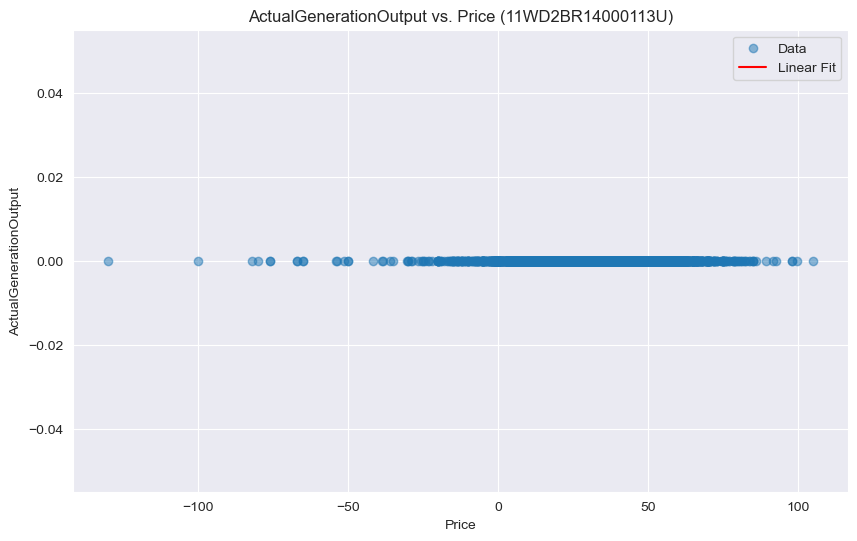

Generation Unit EIC: 11WD2BR14000113U
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: 0.0
P-value: 1.0
Standard Error: nan




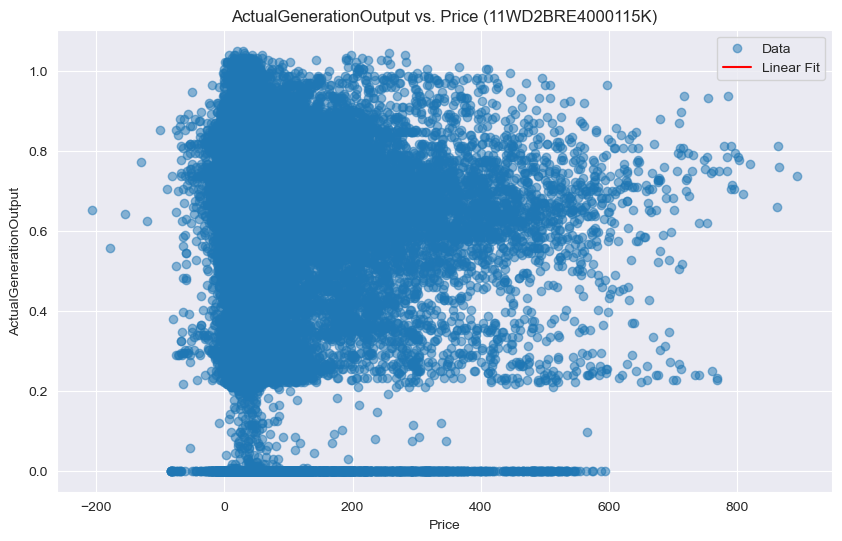

Generation Unit EIC: 11WD2BRE4000115K
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




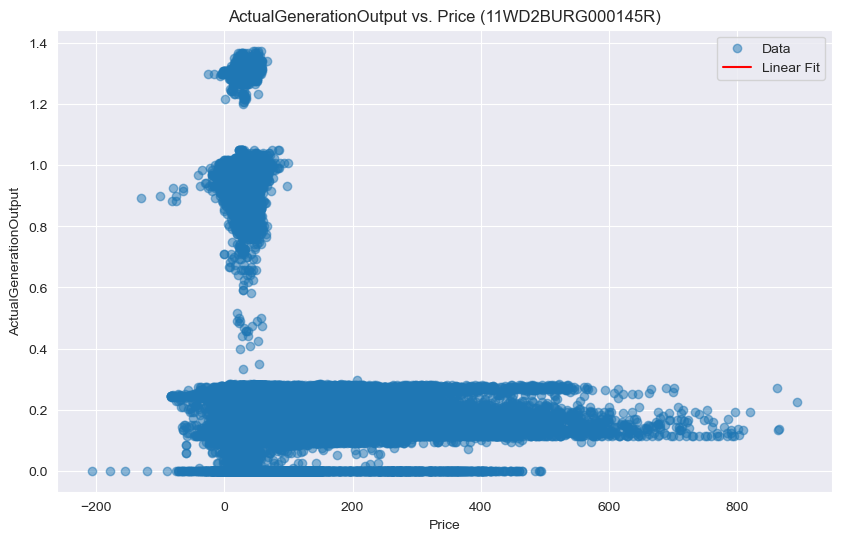

Generation Unit EIC: 11WD2BURG000145R
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




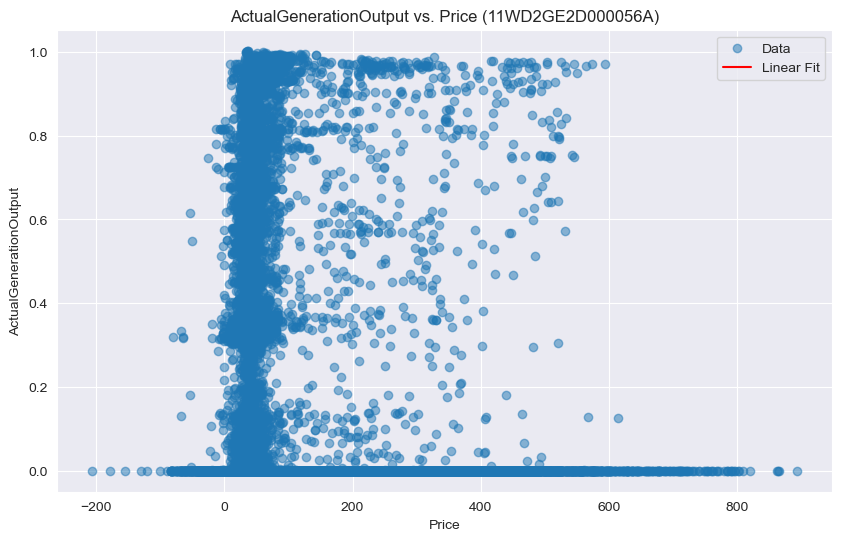

Generation Unit EIC: 11WD2GE2D000056A
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




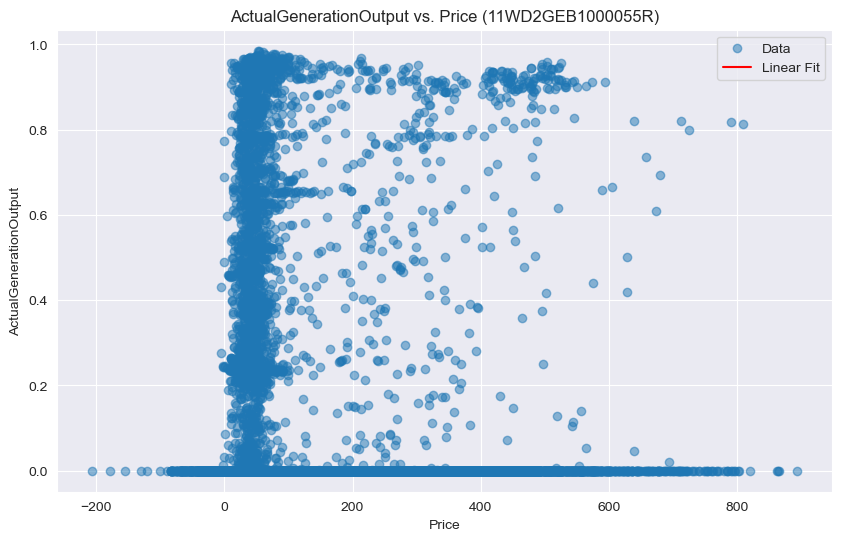

Generation Unit EIC: 11WD2GEB1000055R
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




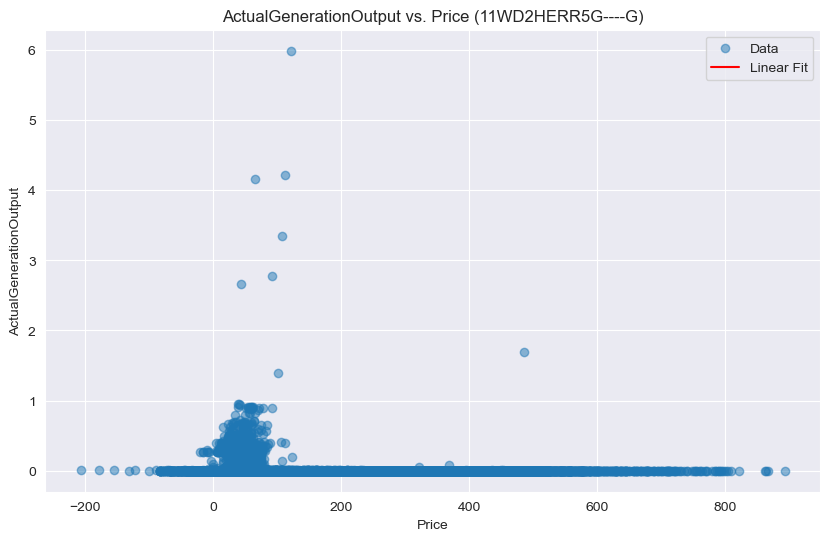

Generation Unit EIC: 11WD2HERR5G----G
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




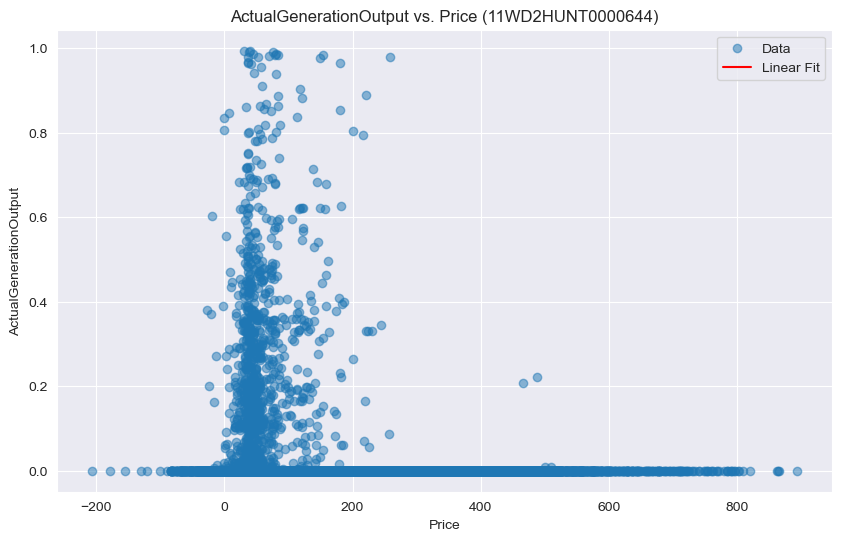

Generation Unit EIC: 11WD2HUNT0000644
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




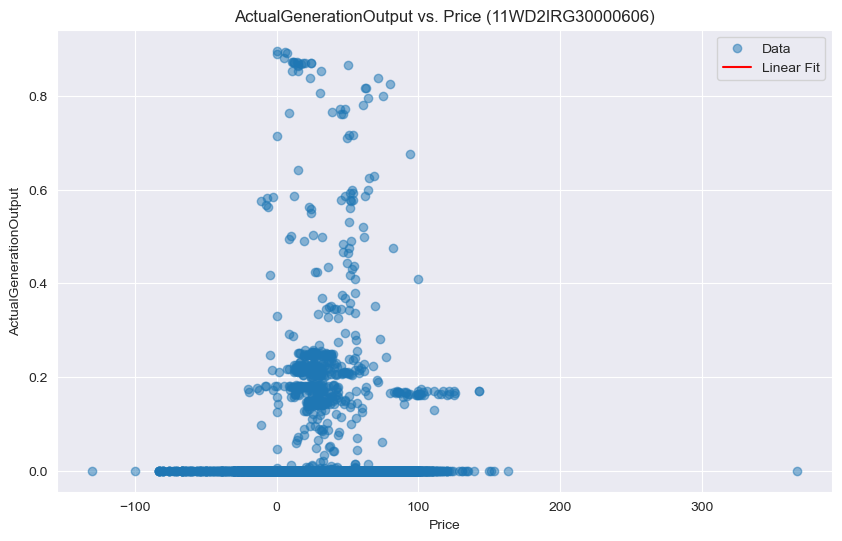

Generation Unit EIC: 11WD2IRG30000606
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




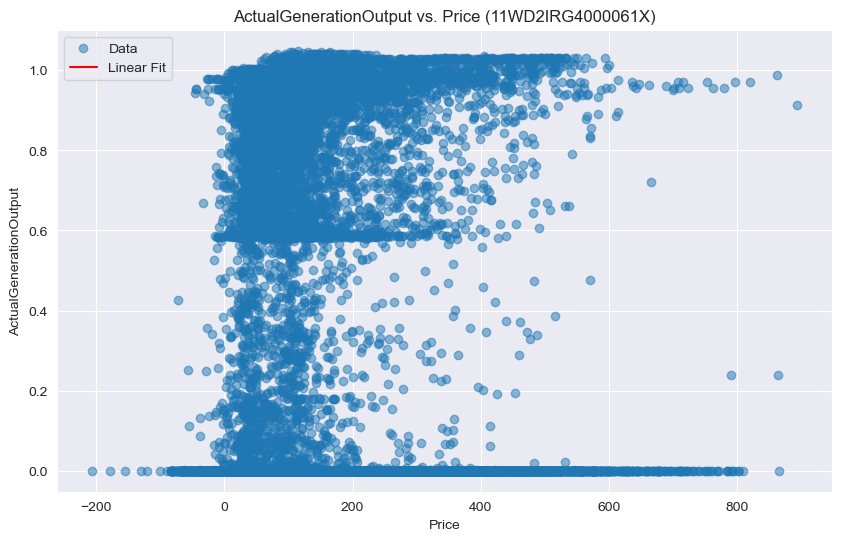

Generation Unit EIC: 11WD2IRG4000061X
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




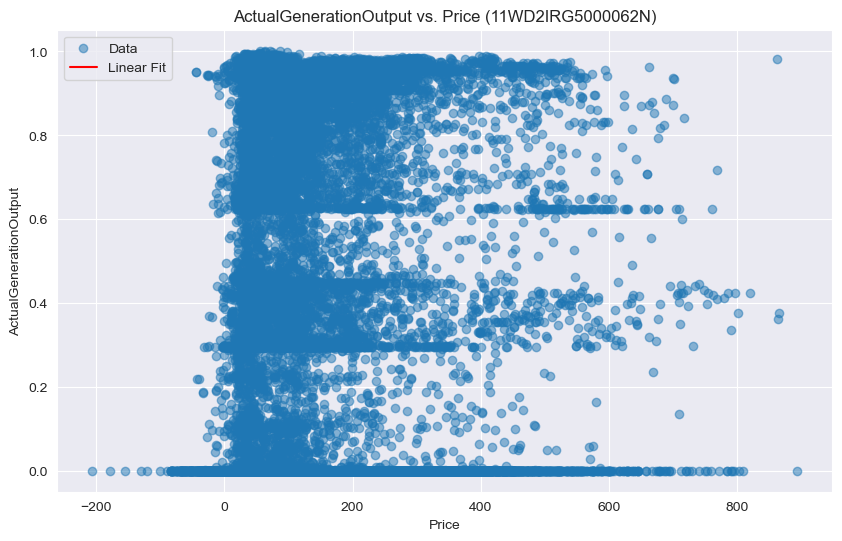

Generation Unit EIC: 11WD2IRG5000062N
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




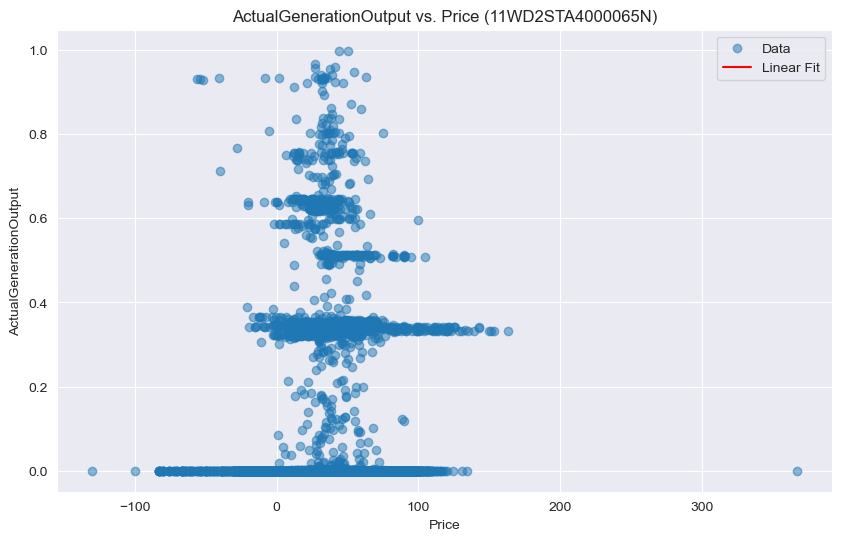

Generation Unit EIC: 11WD2STA4000065N
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




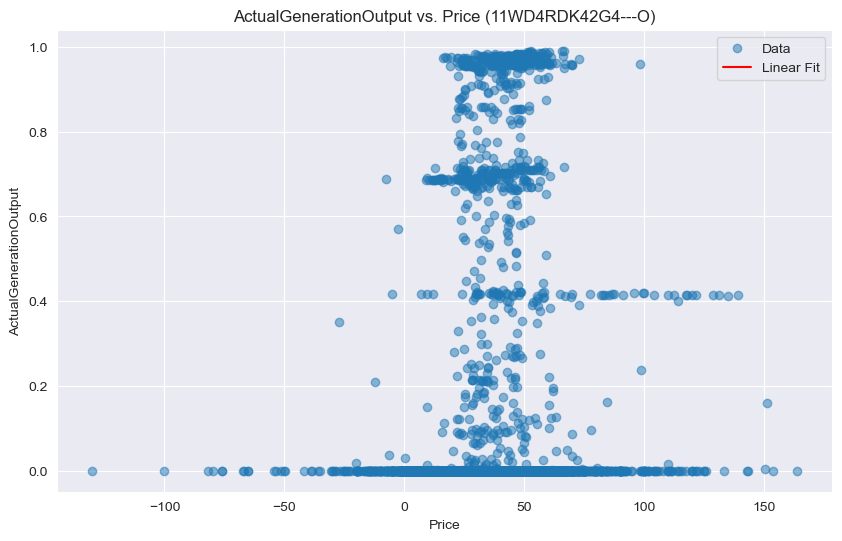

Generation Unit EIC: 11WD4RDK42G4---O
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




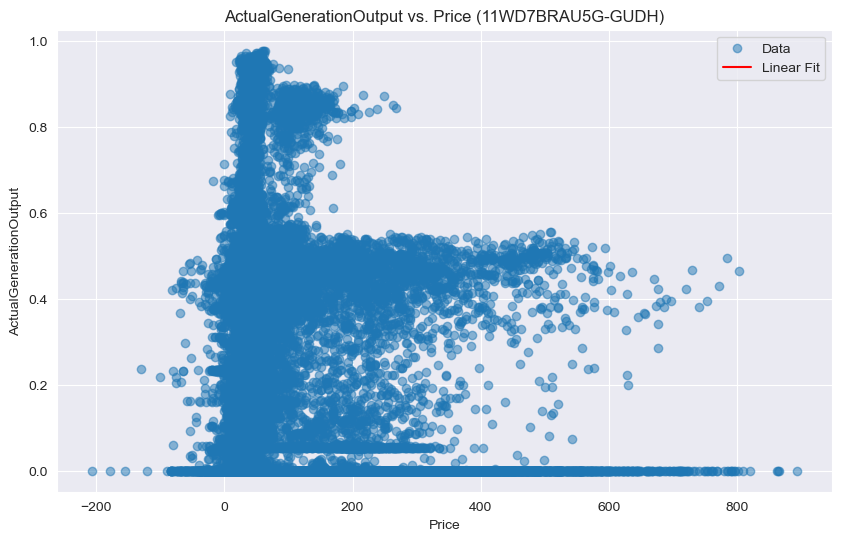

Generation Unit EIC: 11WD7BRAU5G-GUDH
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




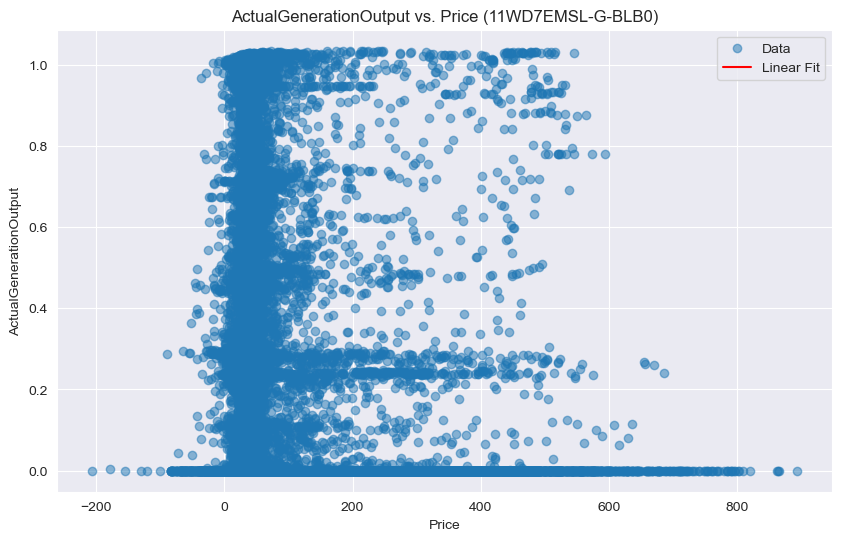

Generation Unit EIC: 11WD7EMSL-G-BLB0
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




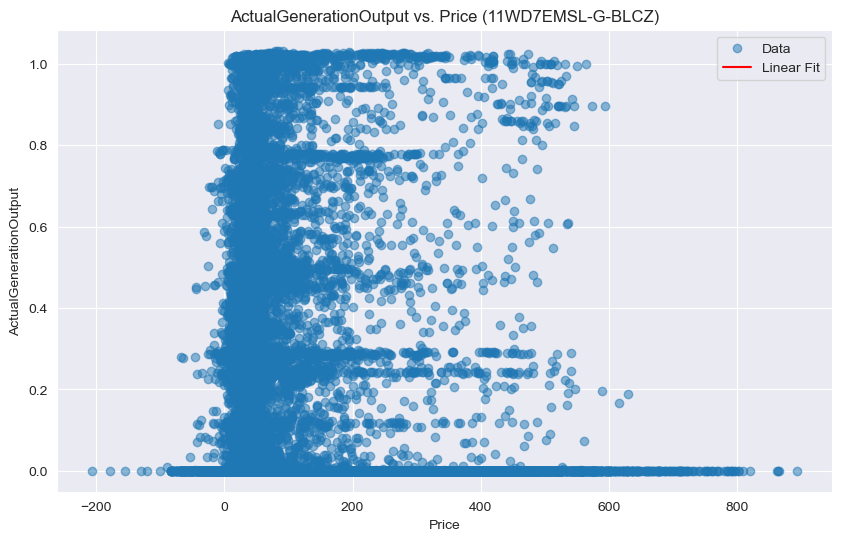

Generation Unit EIC: 11WD7EMSL-G-BLCZ
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




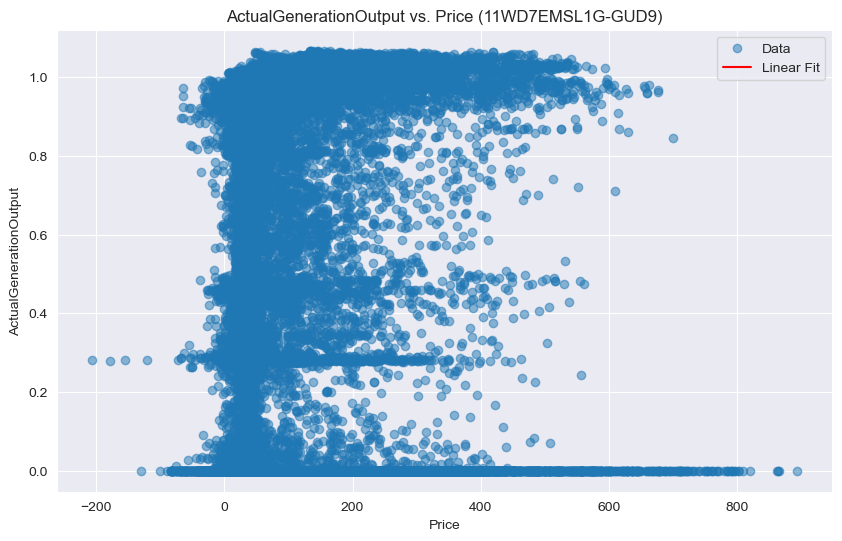

Generation Unit EIC: 11WD7EMSL1G-GUD9
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




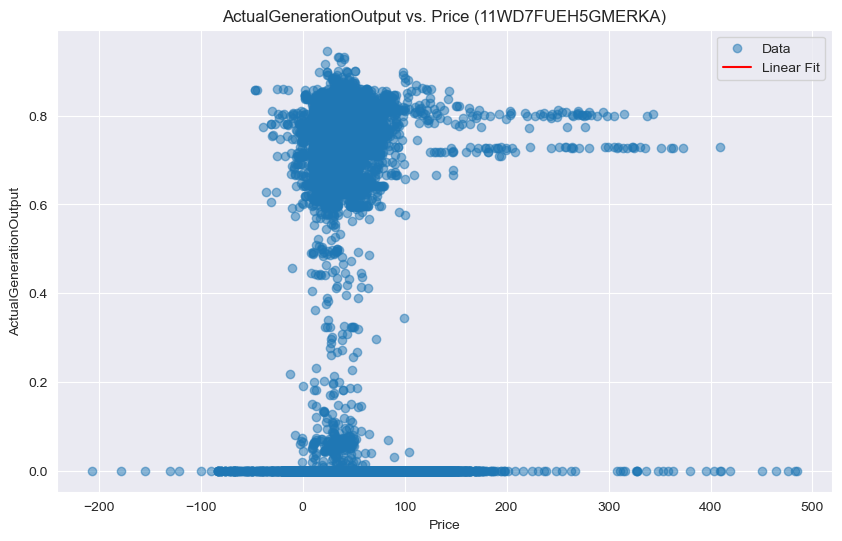

Generation Unit EIC: 11WD7FUEH5GMERKA
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




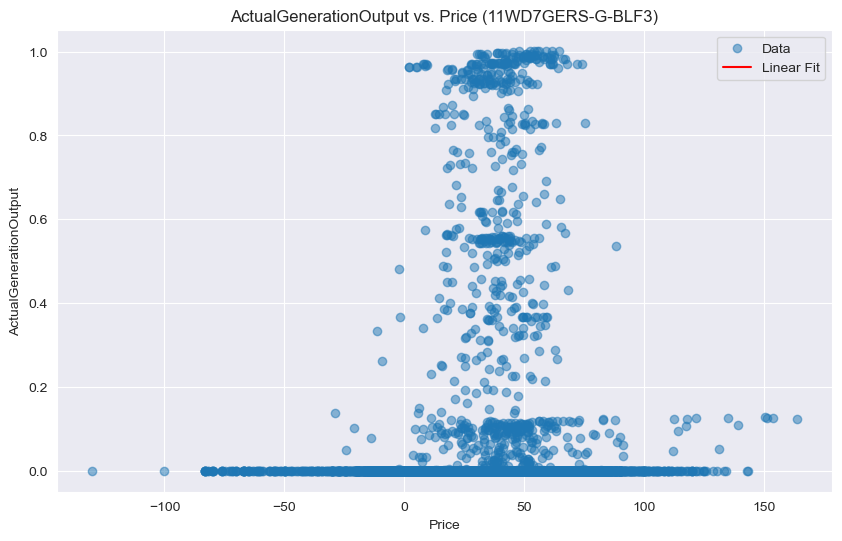

Generation Unit EIC: 11WD7GERS-G-BLF3
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




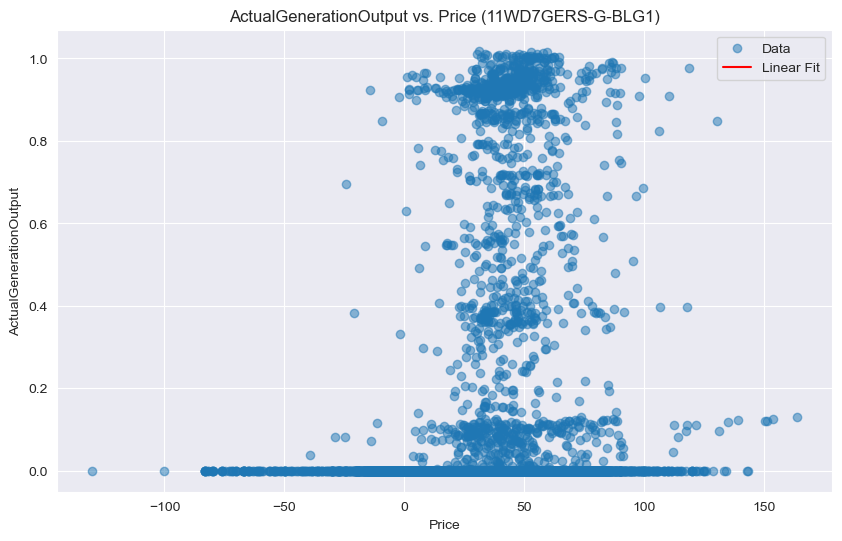

Generation Unit EIC: 11WD7GERS-G-BLG1
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




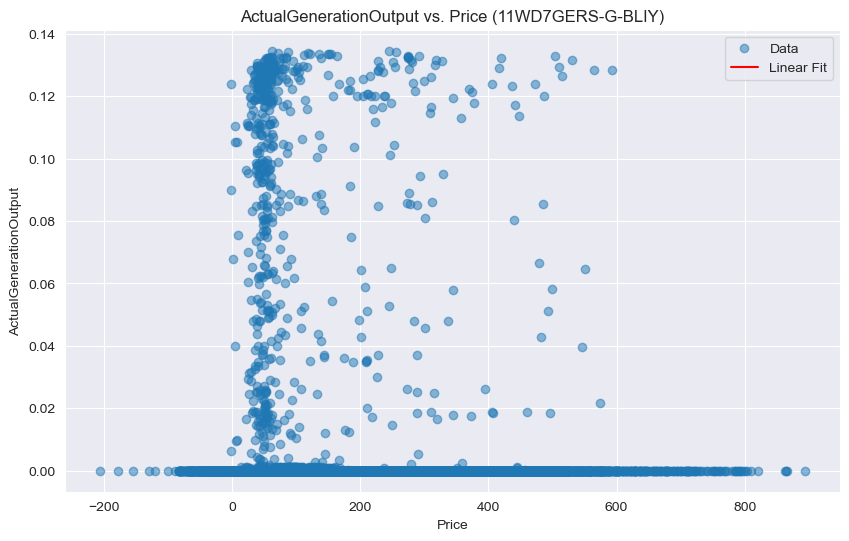

Generation Unit EIC: 11WD7GERS-G-BLIY
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




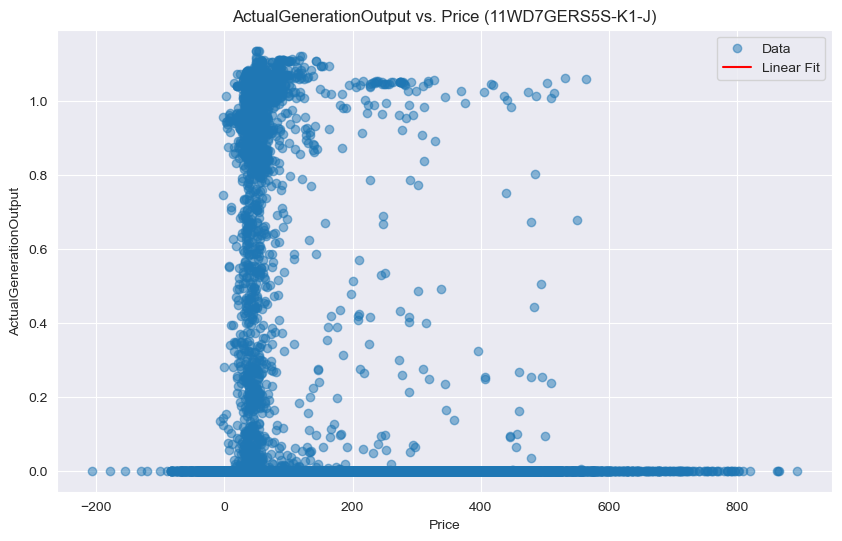

Generation Unit EIC: 11WD7GERS5S-K1-J
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




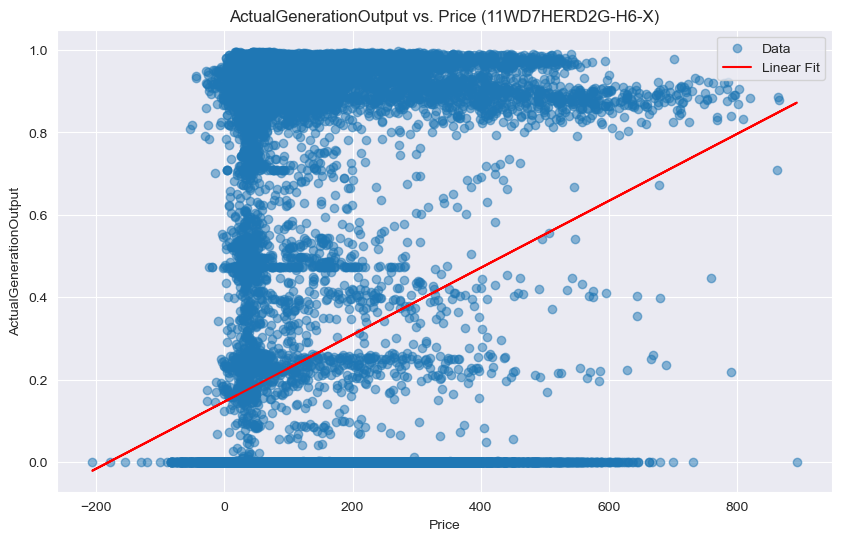

Generation Unit EIC: 11WD7HERD2G-H6-X
Linear Regression Results:
Slope (Coefficient): 0.0008118420266428818
Intercept: 0.14657833329158865
R-squared Value: 0.03566464751907723
P-value: 0.0
Standard Error: 1.5738169728819345e-05




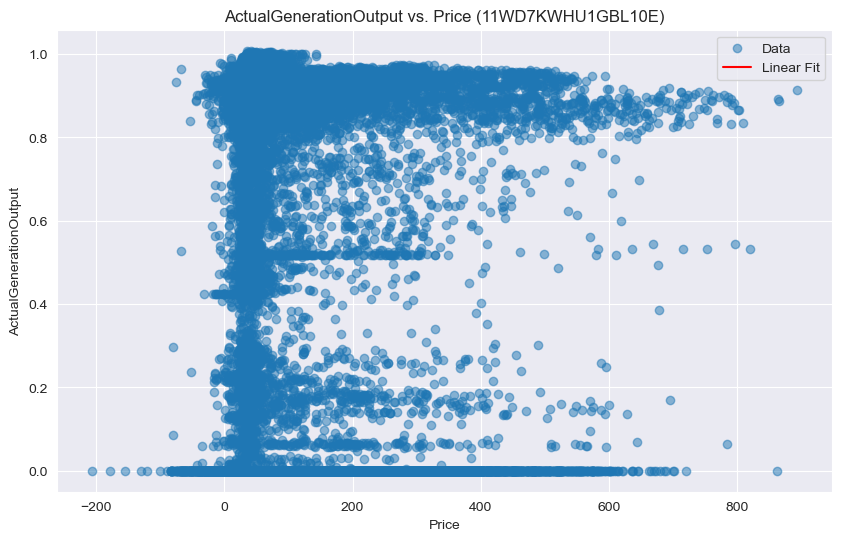

Generation Unit EIC: 11WD7KWHU1GBL10E
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




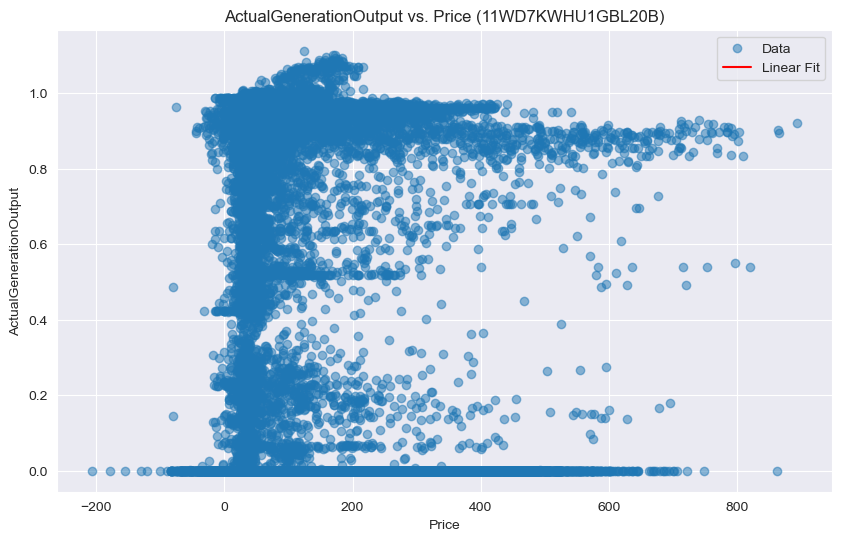

Generation Unit EIC: 11WD7KWHU1GBL20B
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




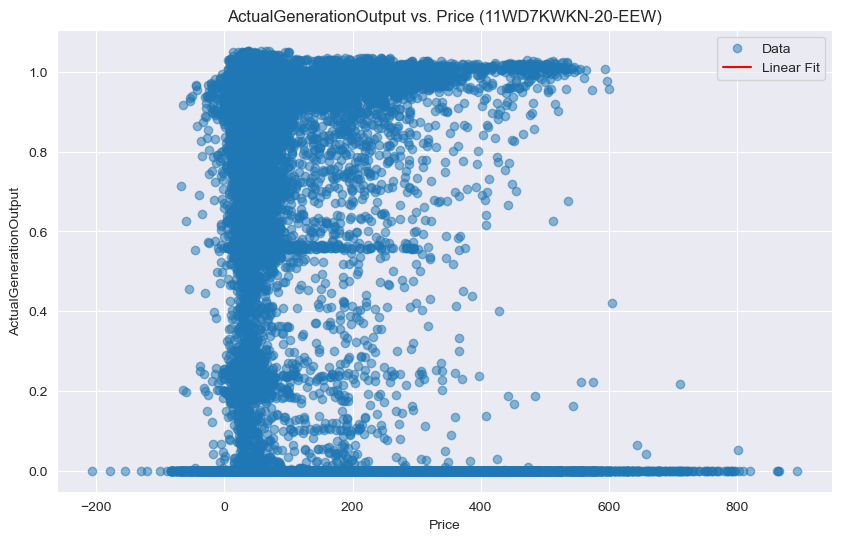

Generation Unit EIC: 11WD7KWKN-20-EEW
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




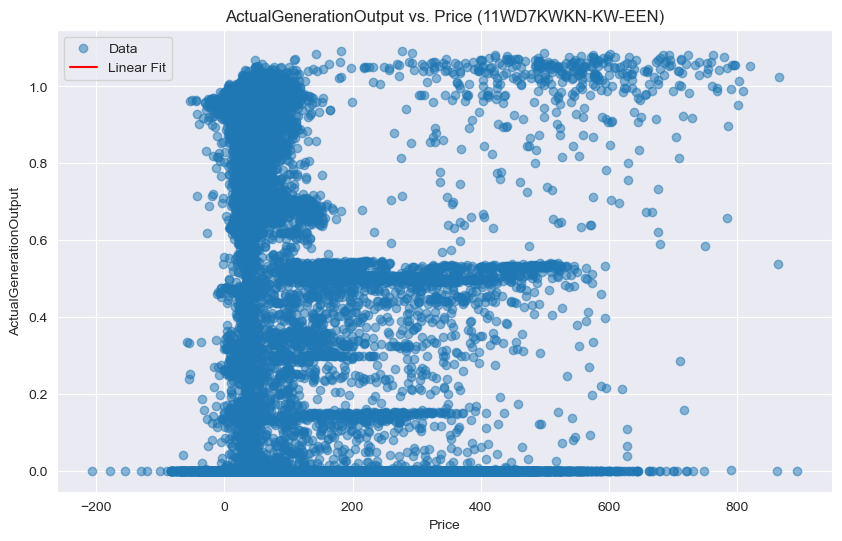

Generation Unit EIC: 11WD7KWKN-KW-EEN
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




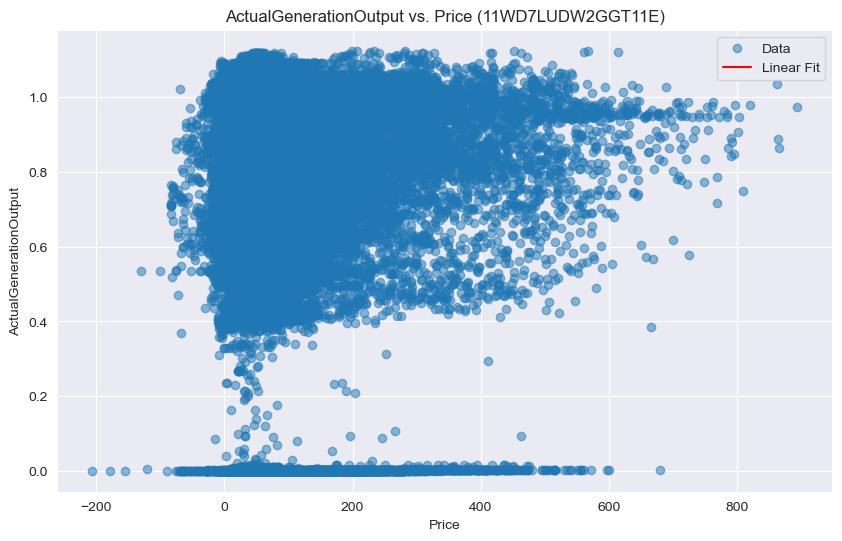

Generation Unit EIC: 11WD7LUDW2GGT11E
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




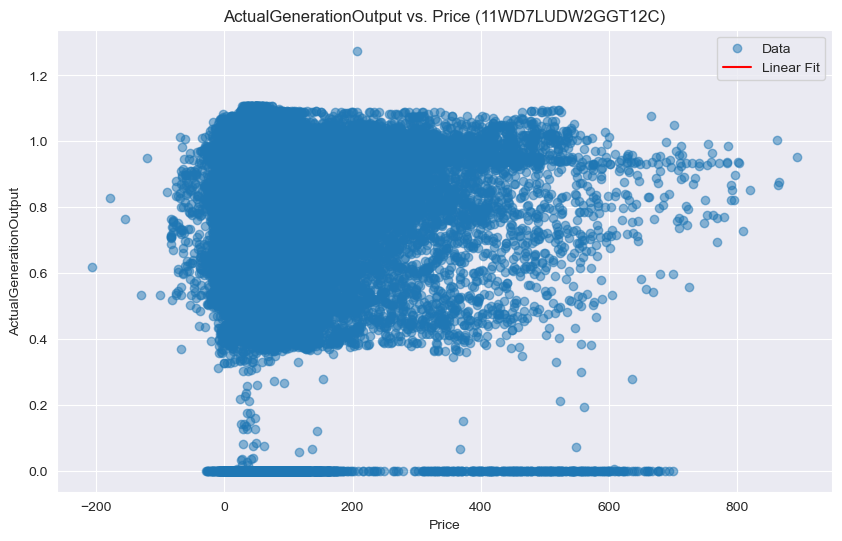

Generation Unit EIC: 11WD7LUDW2GGT12C
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




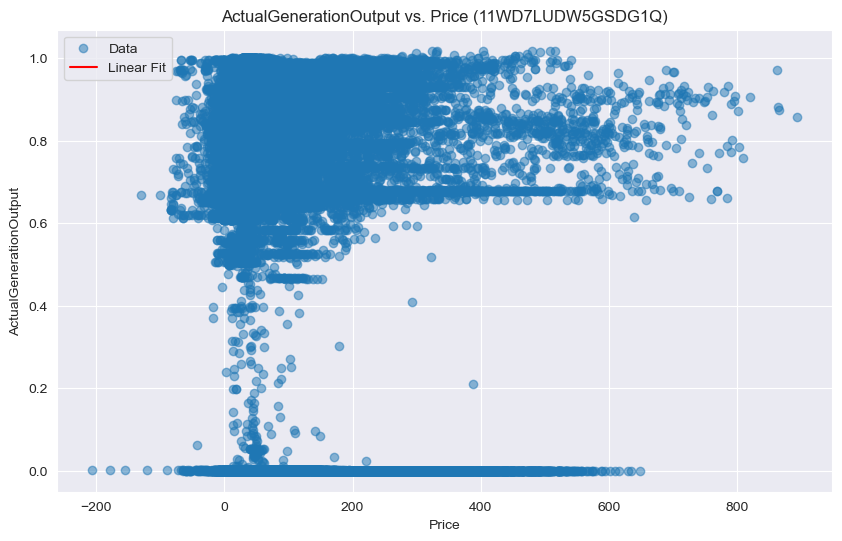

Generation Unit EIC: 11WD7LUDW5GSDG1Q
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




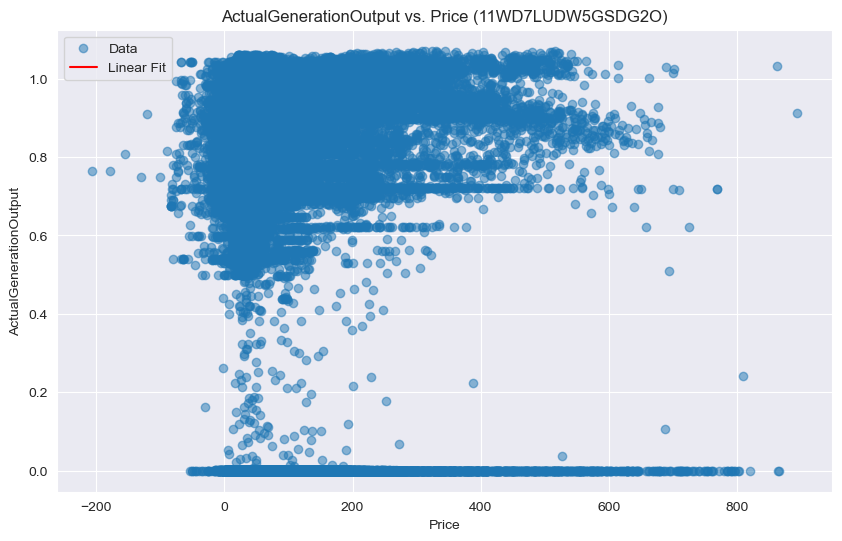

Generation Unit EIC: 11WD7LUDW5GSDG2O
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




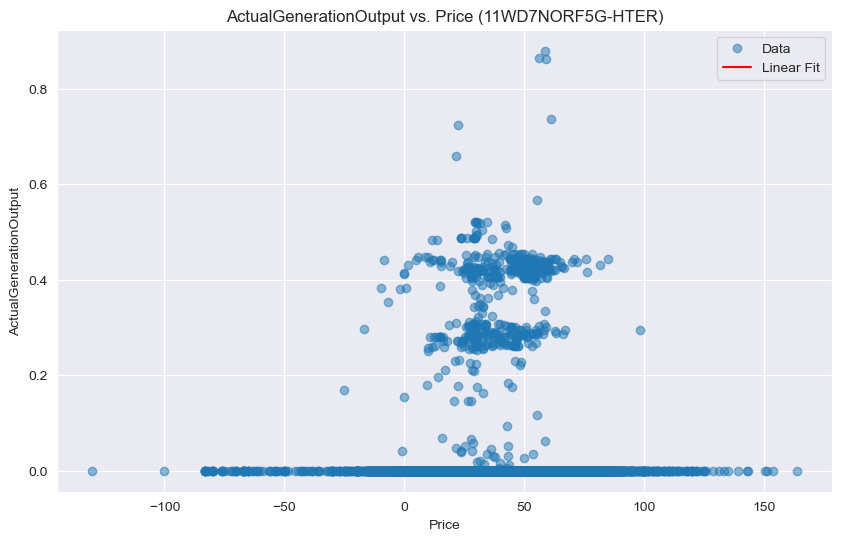

Generation Unit EIC: 11WD7NORF5G-HTER
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




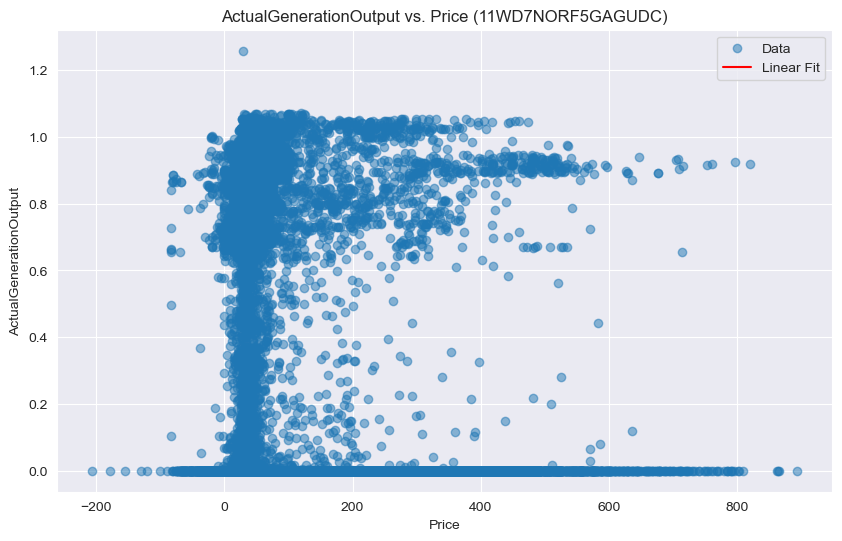

Generation Unit EIC: 11WD7NORF5GAGUDC
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




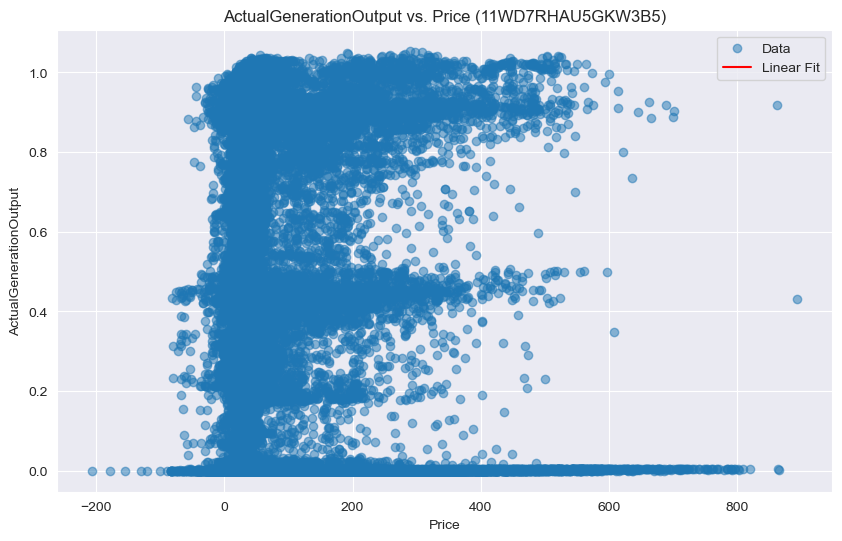

Generation Unit EIC: 11WD7RHAU5GKW3B5
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




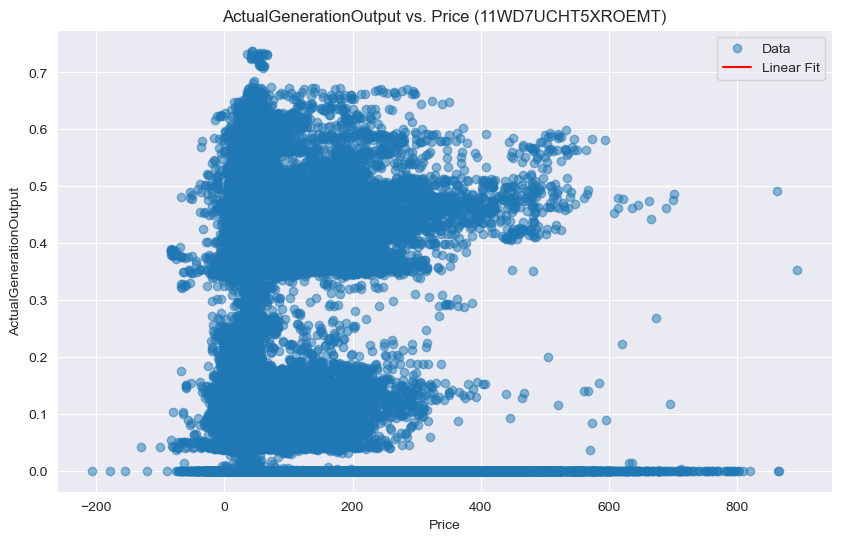

Generation Unit EIC: 11WD7UCHT5XROEMT
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




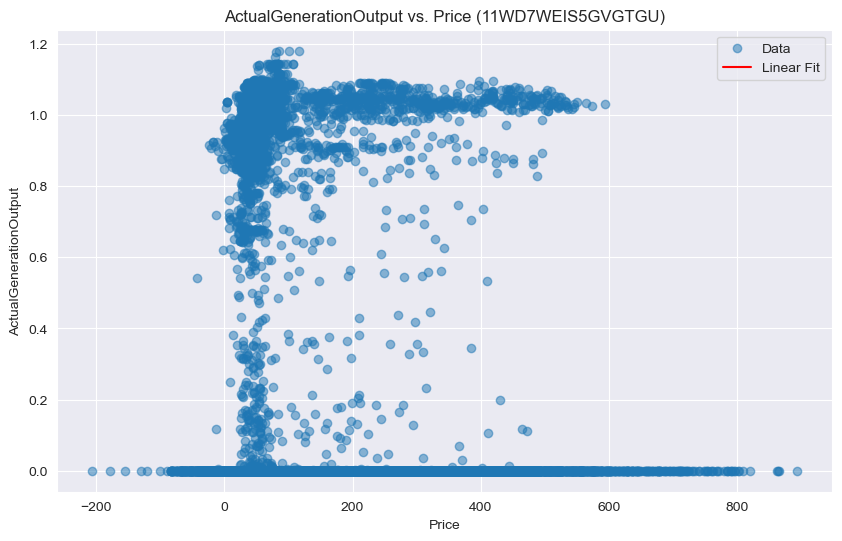

Generation Unit EIC: 11WD7WEIS5GVGTGU
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




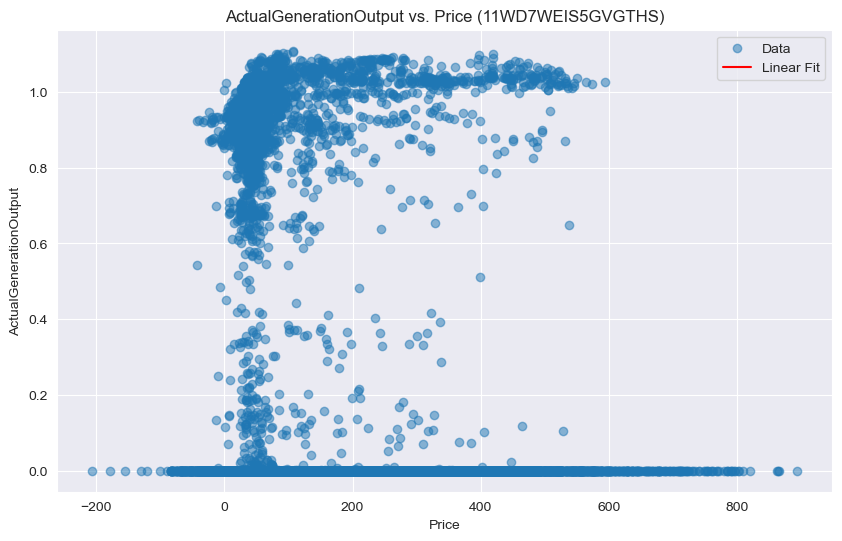

Generation Unit EIC: 11WD7WEIS5GVGTHS
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




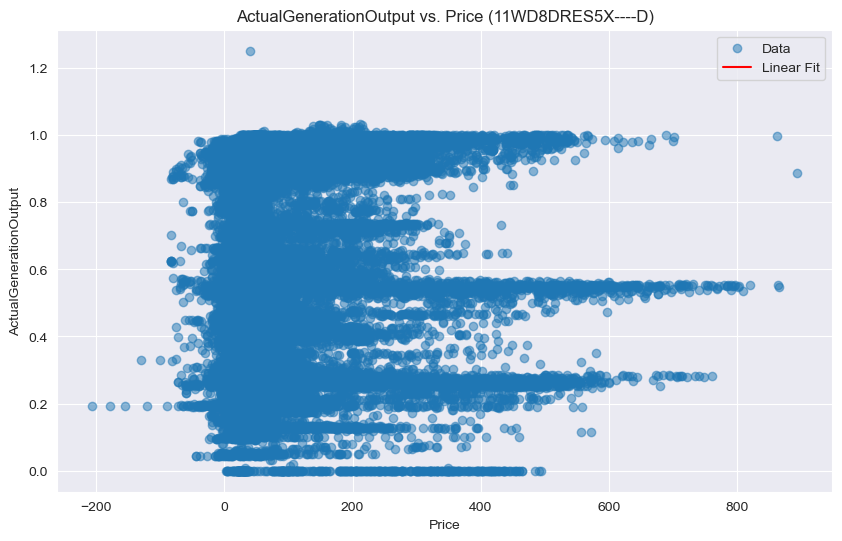

Generation Unit EIC: 11WD8DRES5X----D
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




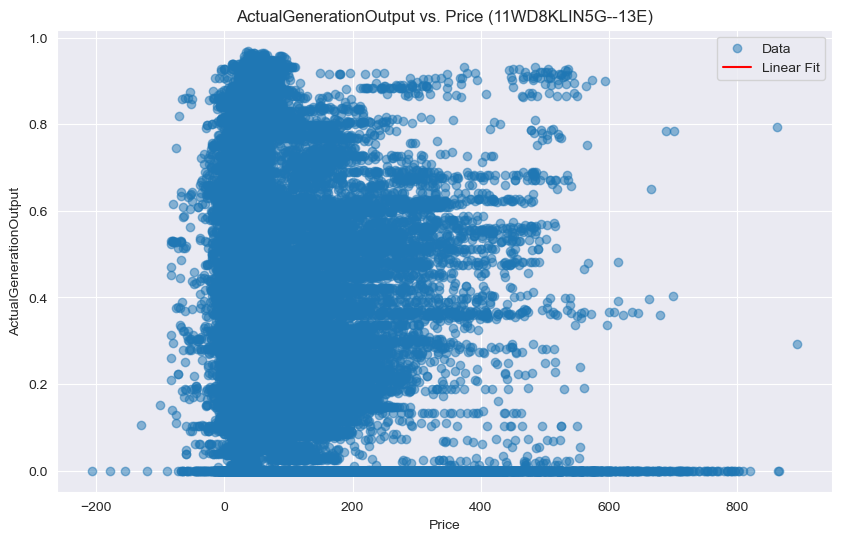

Generation Unit EIC: 11WD8KLIN5G--13E
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




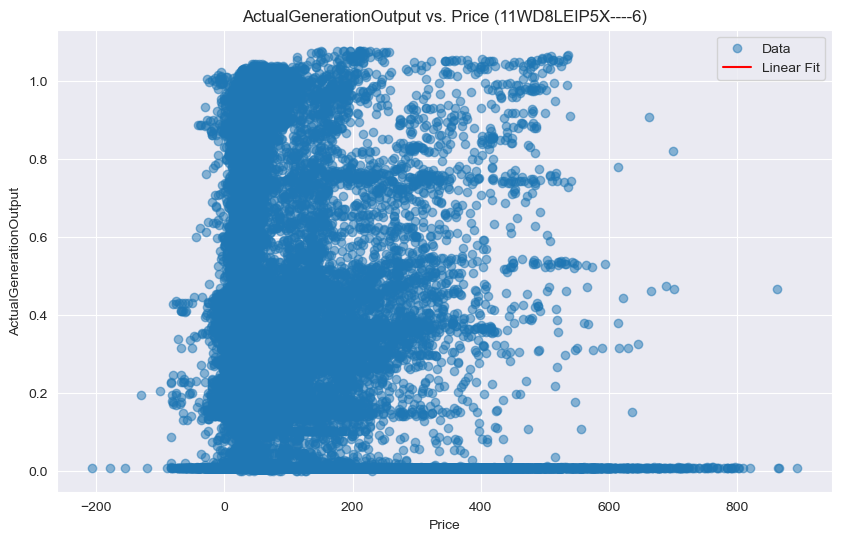

Generation Unit EIC: 11WD8LEIP5X----6
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




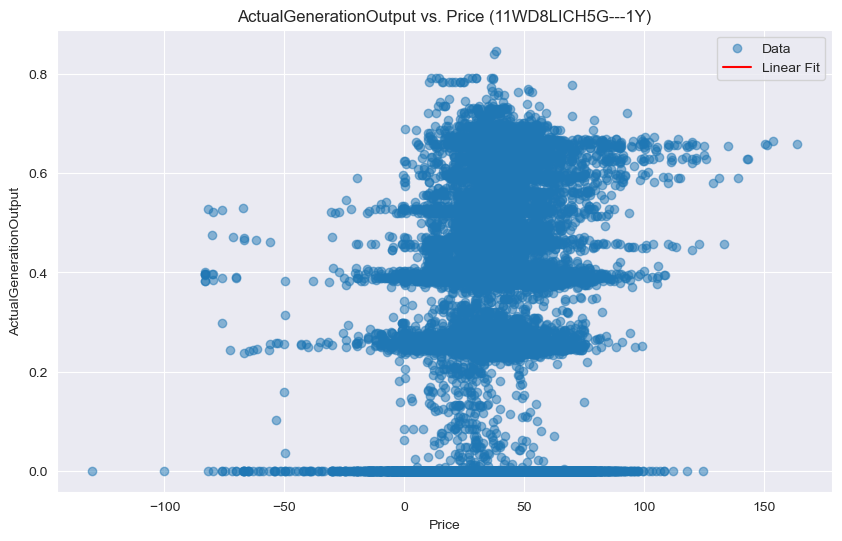

Generation Unit EIC: 11WD8LICH5G---1Y
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




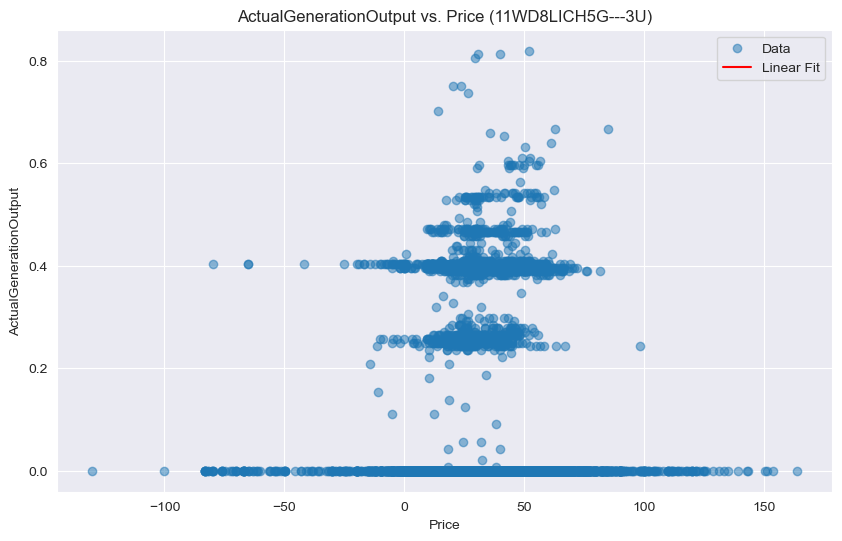

Generation Unit EIC: 11WD8LICH5G---3U
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




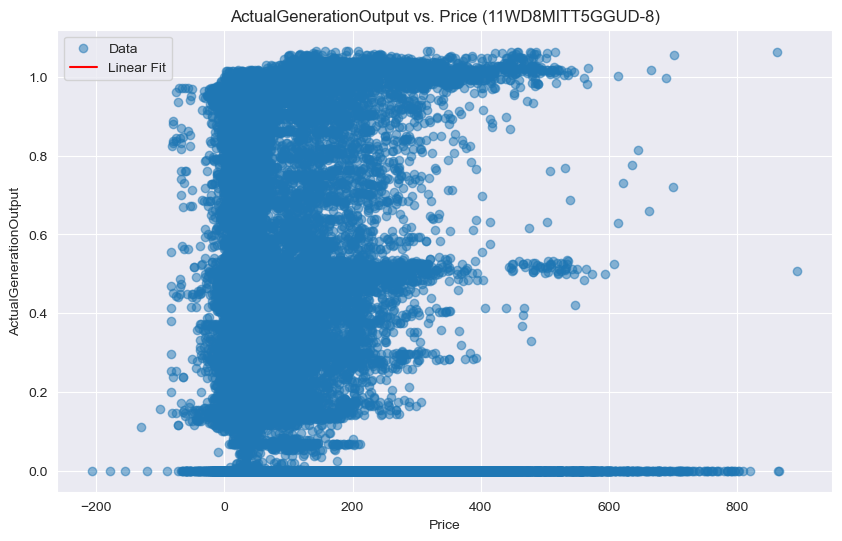

Generation Unit EIC: 11WD8MITT5GGUD-8
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




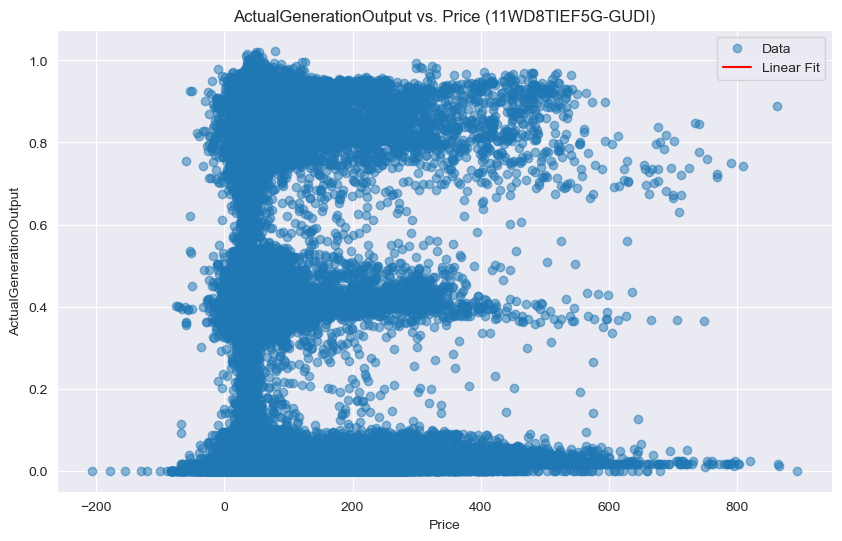

Generation Unit EIC: 11WD8TIEF5G-GUDI
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




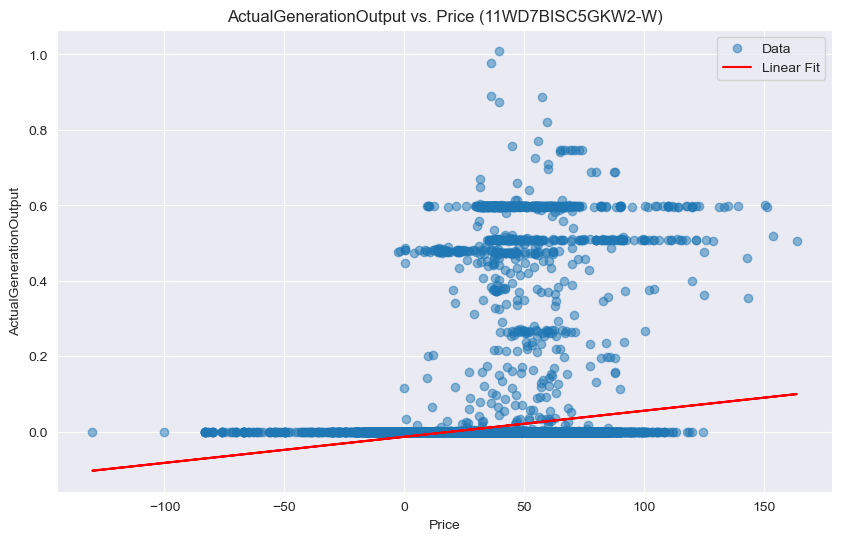

Generation Unit EIC: 11WD7BISC5GKW2-W
Linear Regression Results:
Slope (Coefficient): 0.0006921504779719357
Intercept: -0.013683828064814222
R-squared Value: 0.0222386649519155
P-value: 7.433493812788551e-197
Standard Error: 2.2993674681636356e-05




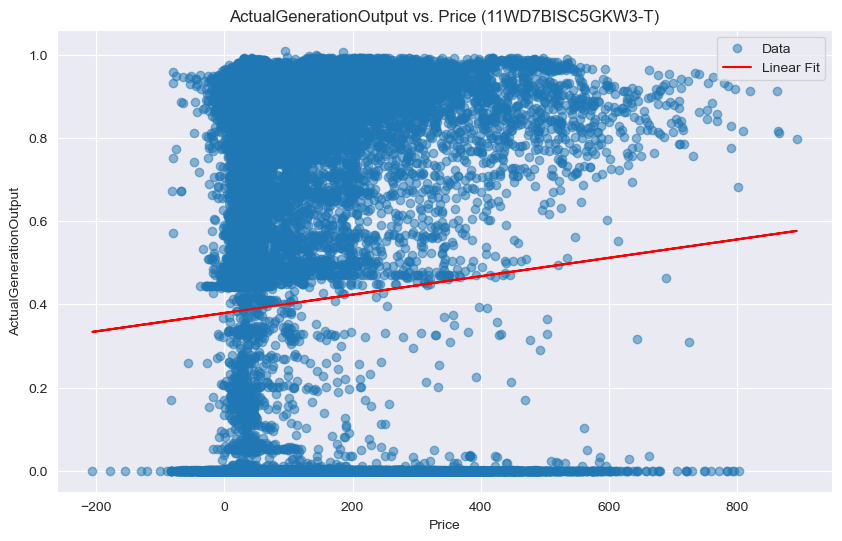

Generation Unit EIC: 11WD7BISC5GKW3-T
Linear Regression Results:
Slope (Coefficient): 0.00022083093292395866
Intercept: 0.3791643219964619
R-squared Value: 0.0020835297517134274
P-value: 2.820015125330251e-33
Standard Error: 1.836367657519866e-05




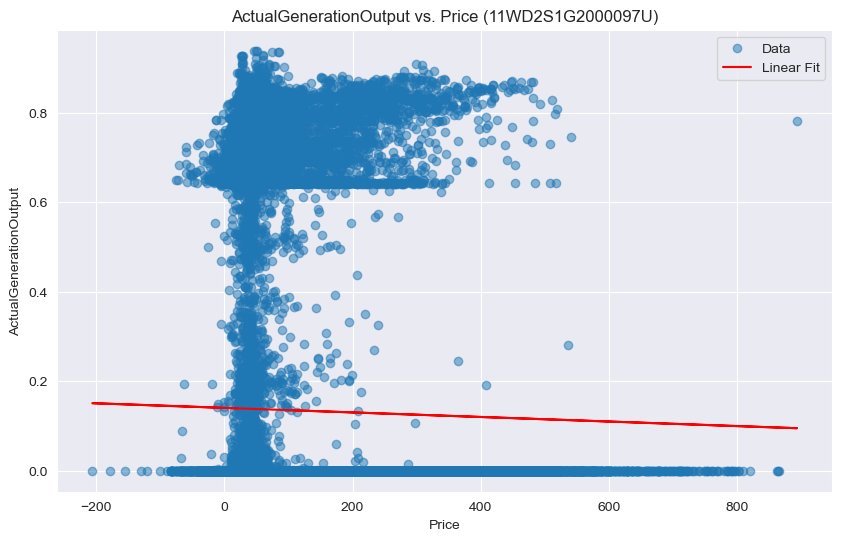

Generation Unit EIC: 11WD2S1G2000097U
Linear Regression Results:
Slope (Coefficient): -5.083803616857617e-05
Intercept: 0.14042829650546365
R-squared Value: 0.0002571827768855837
P-value: 1.997453565144564e-05
Standard Error: 1.1918522566169656e-05




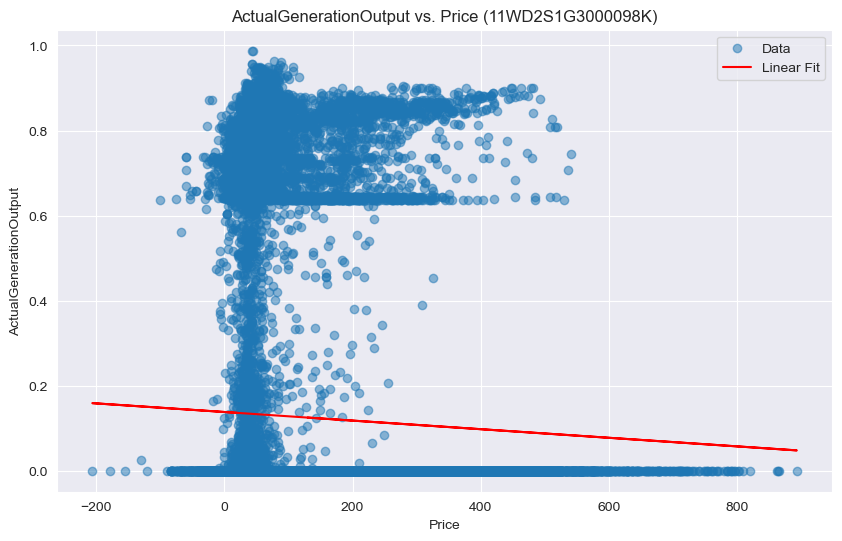

Generation Unit EIC: 11WD2S1G3000098K
Linear Regression Results:
Slope (Coefficient): -0.0001010254902210304
Intercept: 0.1380920133381787
R-squared Value: 0.0010253241812701126
P-value: 1.625426391685979e-17
Standard Error: 1.1857361420843879e-05




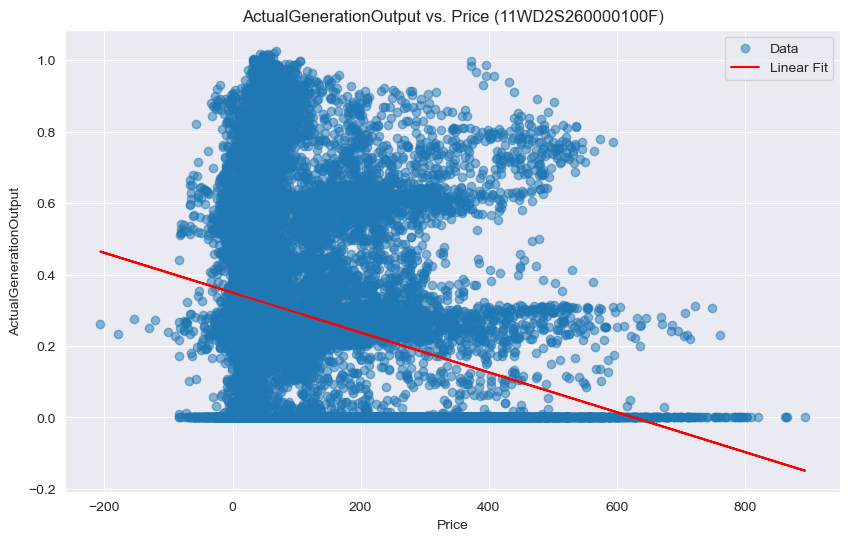

Generation Unit EIC: 11WD2S260000100F
Linear Regression Results:
Slope (Coefficient): -0.0005578846038066981
Intercept: 0.3493119758007215
R-squared Value: 0.030507563623129248
P-value: 0.0
Standard Error: 1.1827525827055274e-05




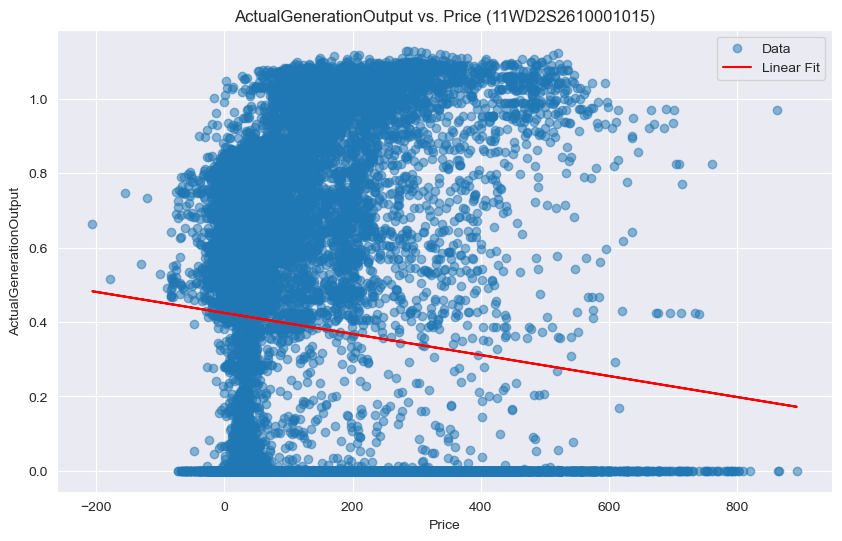

Generation Unit EIC: 11WD2S2610001015
Linear Regression Results:
Slope (Coefficient): -0.00028251684907905155
Intercept: 0.4242588256526869
R-squared Value: 0.004673472796126867
P-value: 4.986536492488464e-74
Standard Error: 1.5503070982531038e-05




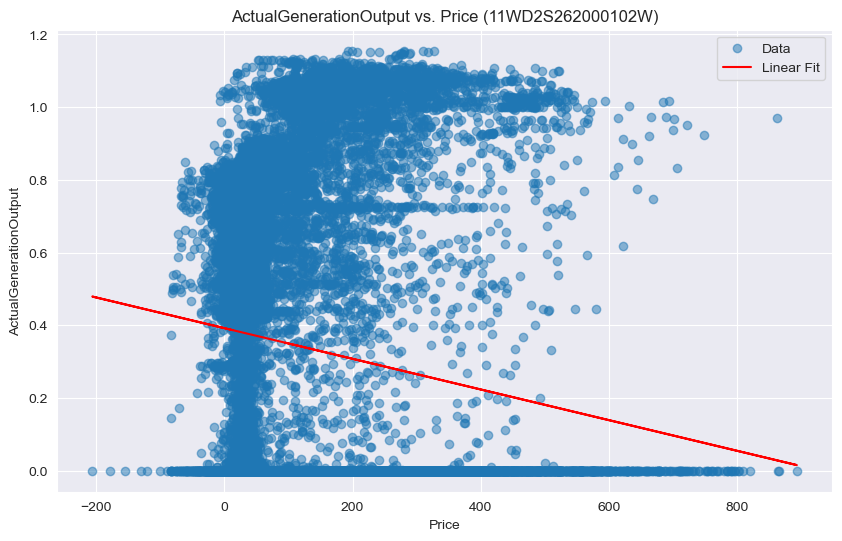

Generation Unit EIC: 11WD2S262000102W
Linear Regression Results:
Slope (Coefficient): -0.0004215194392598597
Intercept: 0.3921260076135936
R-squared Value: 0.010240757189991283
P-value: 2.4178908468109054e-160
Standard Error: 1.558212945064196e-05




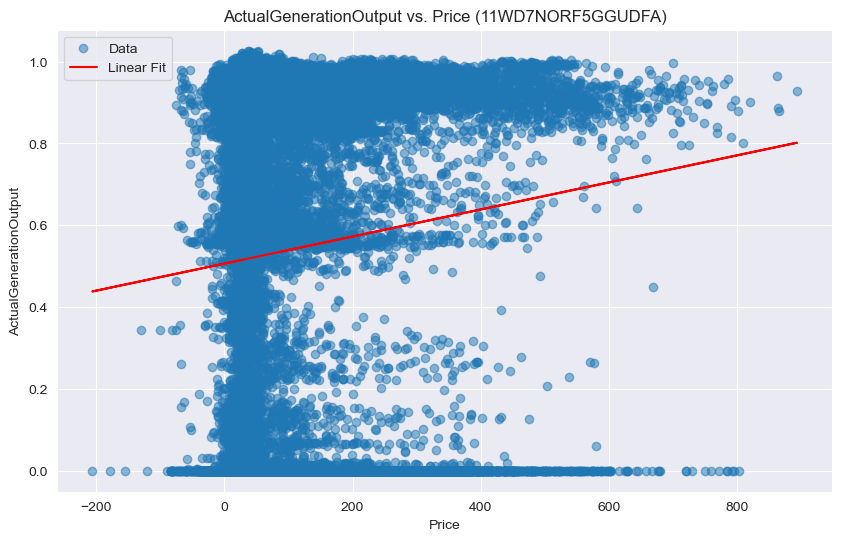

Generation Unit EIC: 11WD7NORF5GGUDFA
Linear Regression Results:
Slope (Coefficient): 0.00033050001072398
Intercept: 0.5062364946099157
R-squared Value: 0.004638612272821632
P-value: 3.174029014745173e-73
Standard Error: 1.823816364502452e-05




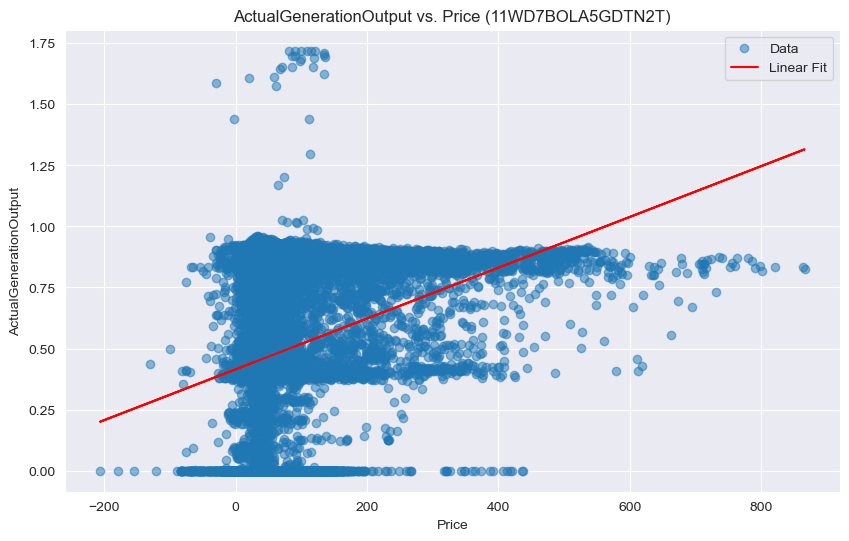

Generation Unit EIC: 11WD7BOLA5GDTN2T
Linear Regression Results:
Slope (Coefficient): 0.0010397681701266508
Intercept: 0.41490204808980435
R-squared Value: 0.029324545759329915
P-value: 4.8306311070887764e-300
Standard Error: 2.787529692760166e-05




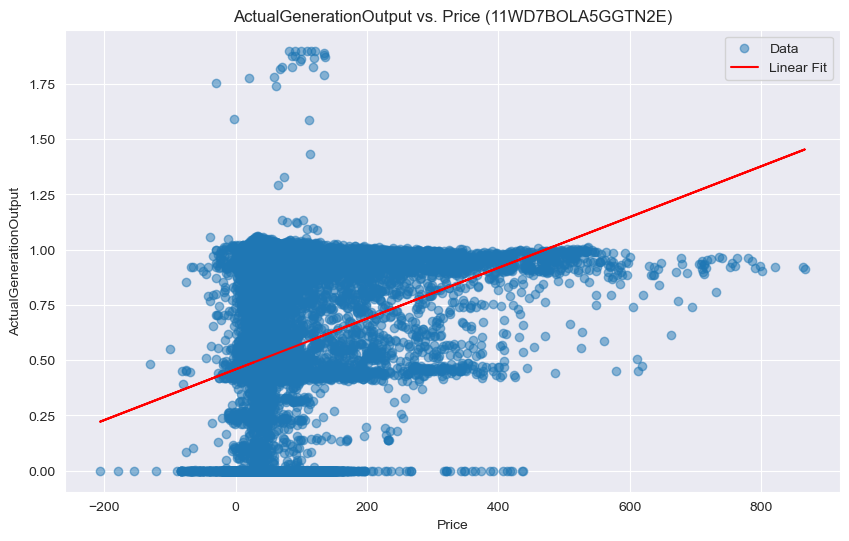

Generation Unit EIC: 11WD7BOLA5GGTN2E
Linear Regression Results:
Slope (Coefficient): 0.0011484870516425489
Intercept: 0.45855661796894137
R-squared Value: 0.02928753229383838
P-value: 1.6374976323675548e-299
Standard Error: 3.081769087415616e-05




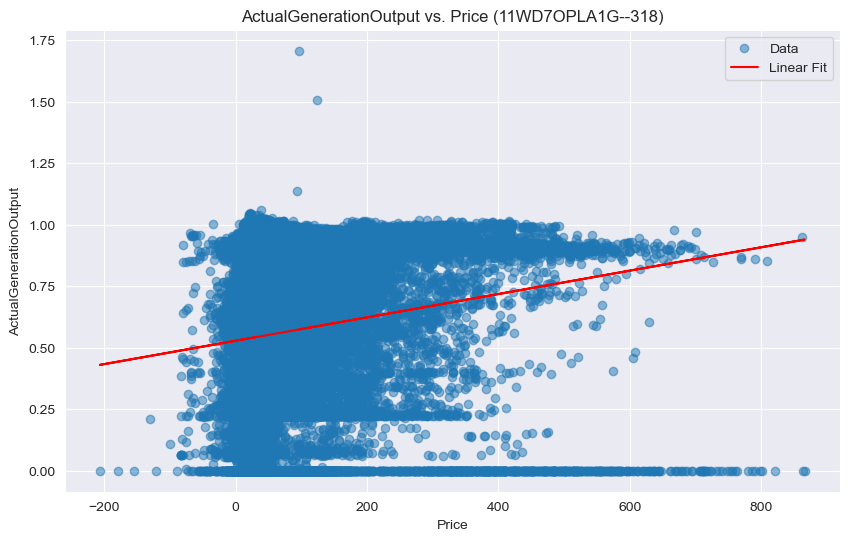

Generation Unit EIC: 11WD7OPLA1G--318
Linear Regression Results:
Slope (Coefficient): 0.0004748014428290054
Intercept: 0.5281577505091845
R-squared Value: 0.013885237087747809
P-value: 2.3198641517824143e-182
Standard Error: 1.6430047149140834e-05




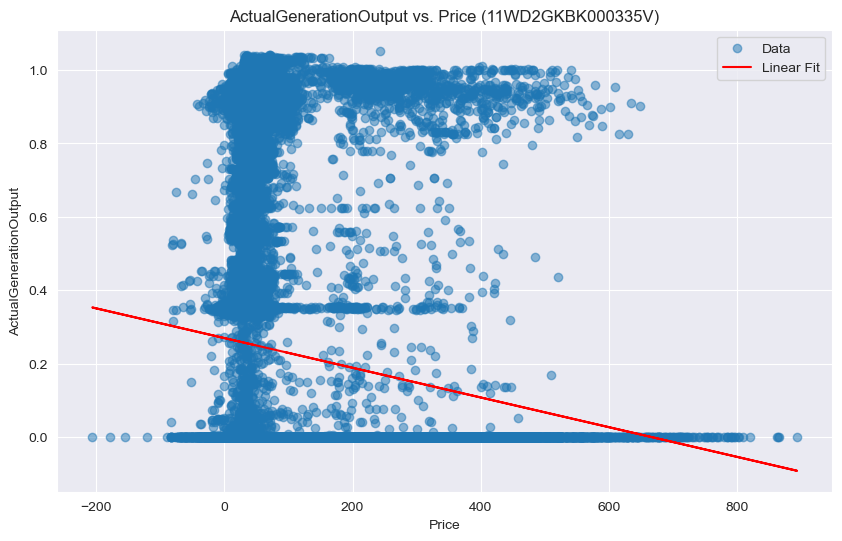

Generation Unit EIC: 11WD2GKBK000335V
Linear Regression Results:
Slope (Coefficient): -0.0004042560954610873
Intercept: 0.2697261692659883
R-squared Value: 0.010660047686533947
P-value: 1.8631234045324327e-140
Standard Error: 1.5979659531181917e-05




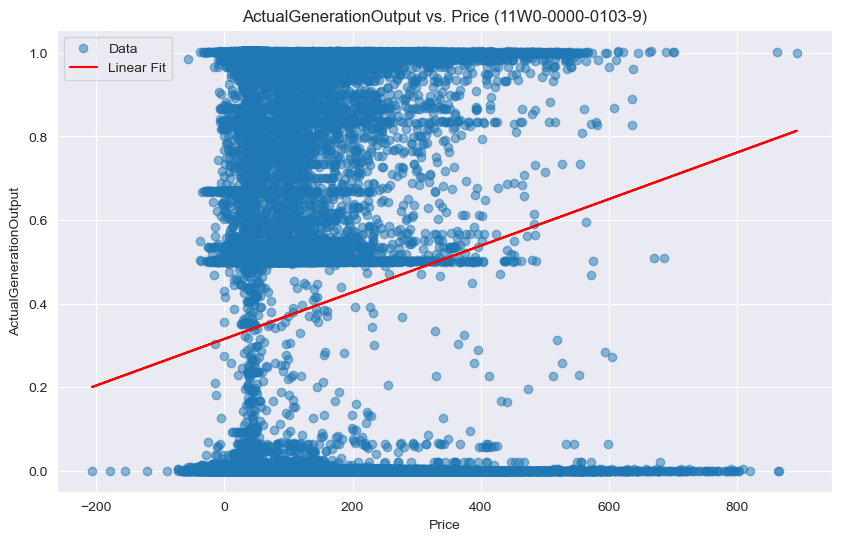

Generation Unit EIC: 11W0-0000-0103-9
Linear Regression Results:
Slope (Coefficient): 0.0005573937224311805
Intercept: 0.31546472699322925
R-squared Value: 0.019576847426573032
P-value: 3.9614653397247295e-176
Standard Error: 1.9601836967671196e-05




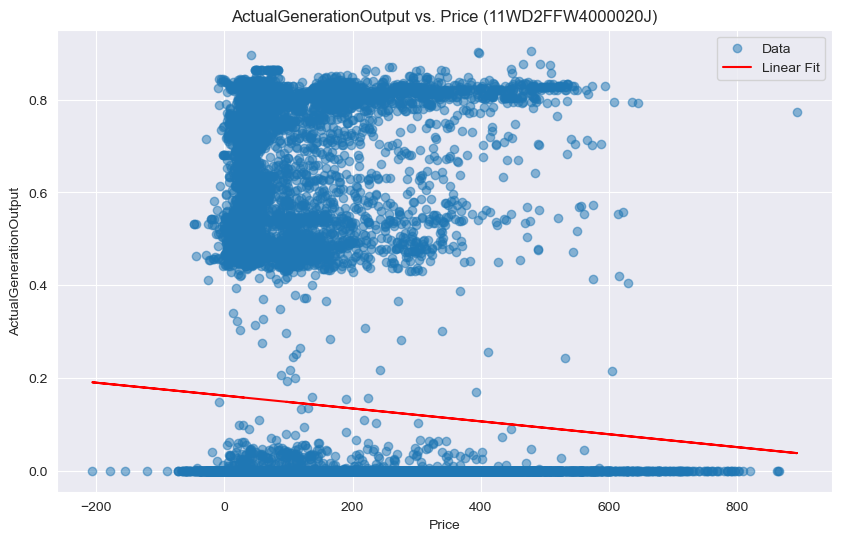

Generation Unit EIC: 11WD2FFW4000020J
Linear Regression Results:
Slope (Coefficient): -0.00013881556288663734
Intercept: 0.16197183096129827
R-squared Value: 0.0032575273533526597
P-value: 6.83807151729507e-26
Standard Error: 1.3181986908887473e-05




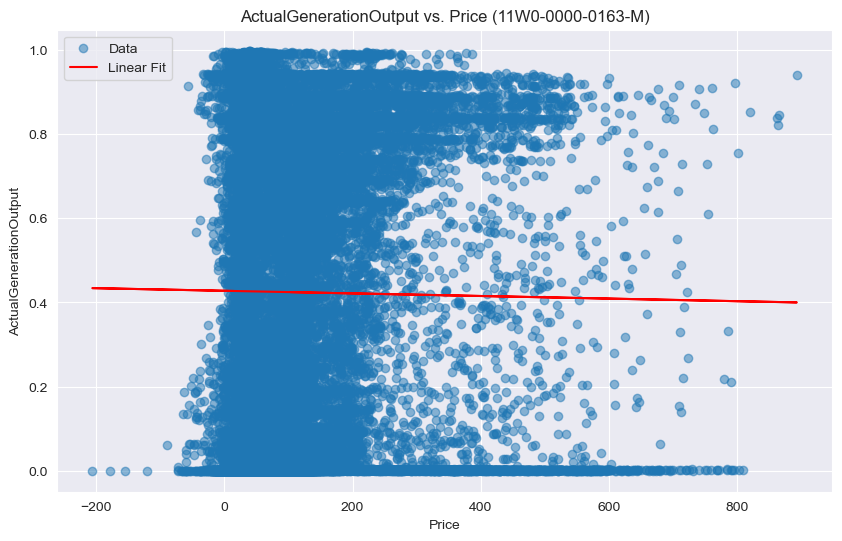

Generation Unit EIC: 11W0-0000-0163-M
Linear Regression Results:
Slope (Coefficient): -3.0890610882707847e-05
Intercept: 0.4276785767554416
R-squared Value: 8.634815722867898e-05
P-value: 0.09189079491526343
Standard Error: 1.8326657348914454e-05




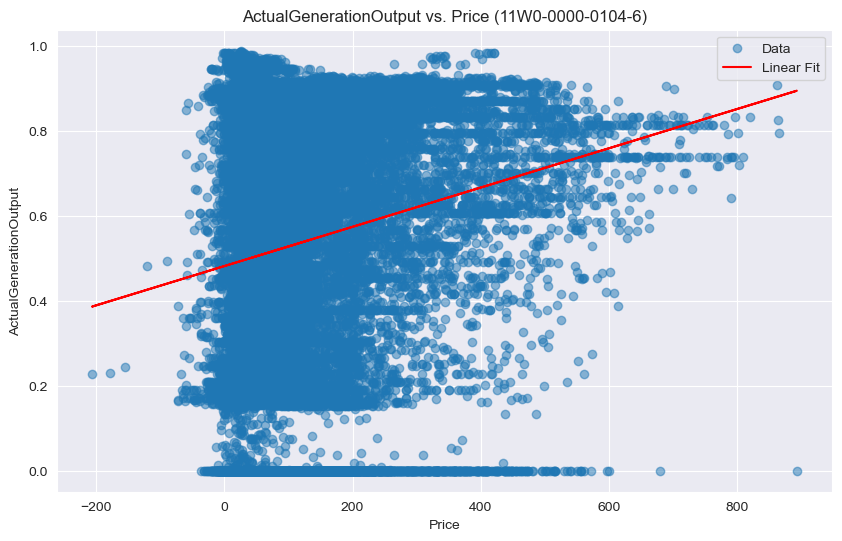

Generation Unit EIC: 11W0-0000-0104-6
Linear Regression Results:
Slope (Coefficient): 0.0004623538902018084
Intercept: 0.482190794271745
R-squared Value: 0.028793282141542628
P-value: 4.998093155613458e-203
Standard Error: 1.5096399991702467e-05




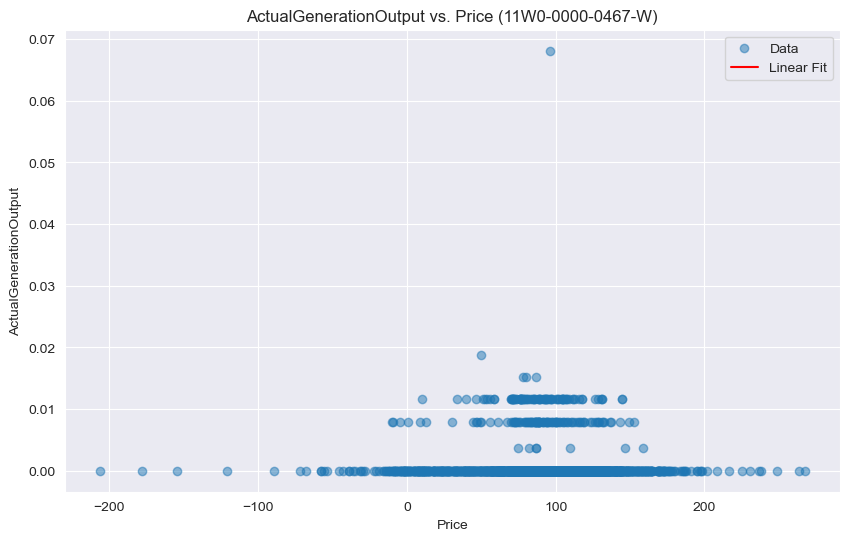

Generation Unit EIC: 11W0-0000-0467-W
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




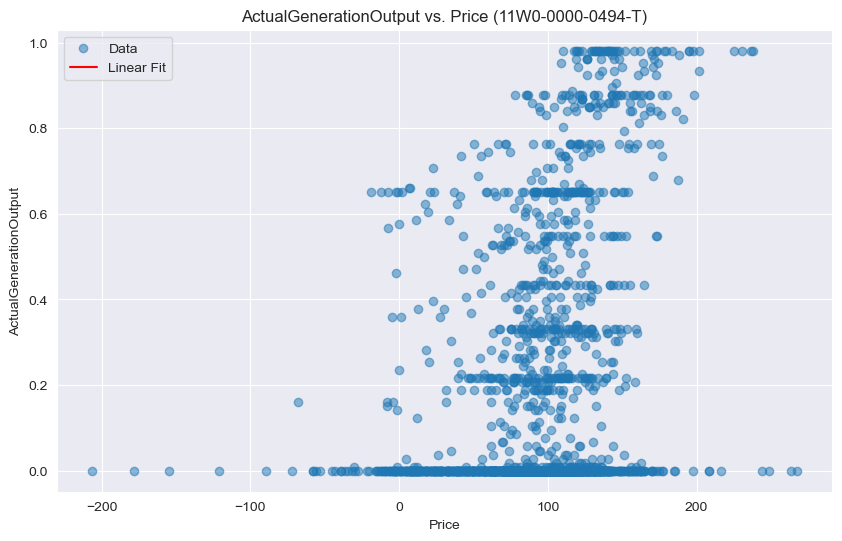

Generation Unit EIC: 11W0-0000-0494-T
Linear Regression Results:
Slope (Coefficient): nan
Intercept: nan
R-squared Value: nan
P-value: nan
Standard Error: nan




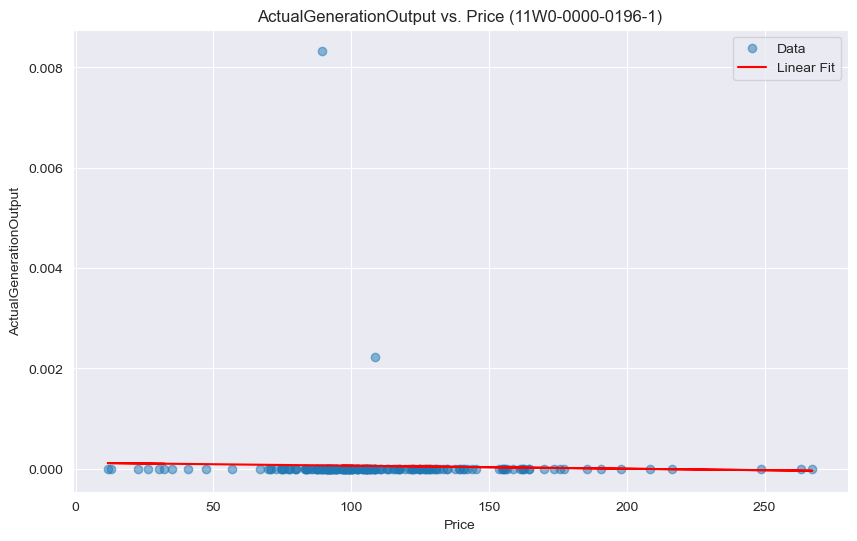

Generation Unit EIC: 11W0-0000-0196-1
Linear Regression Results:
Slope (Coefficient): -5.953717180427883e-07
Intercept: 0.00011721971159219739
R-squared Value: 0.001334474263836096
P-value: 0.6057526935500528
Standard Error: 1.1516702027737384e-06




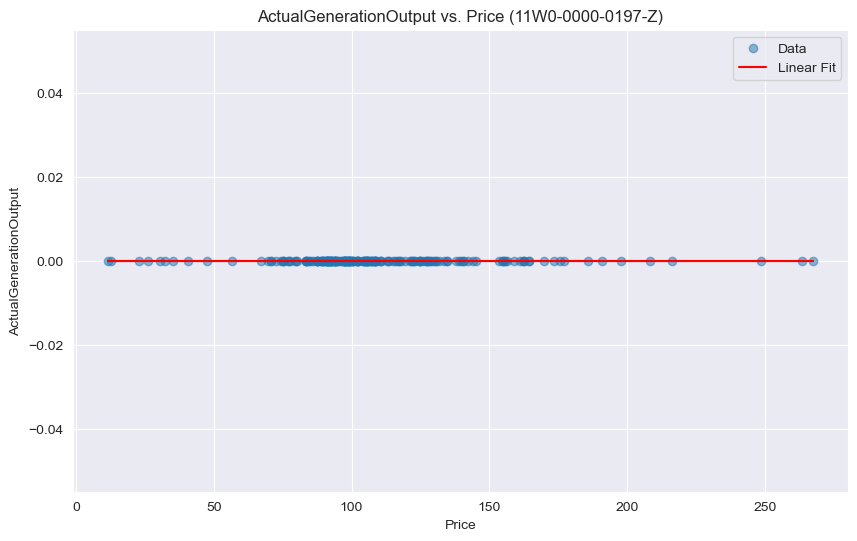

Generation Unit EIC: 11W0-0000-0197-Z
Linear Regression Results:
Slope (Coefficient): 0.0
Intercept: 0.0
R-squared Value: 0.0
P-value: 1.0
Standard Error: 0.0




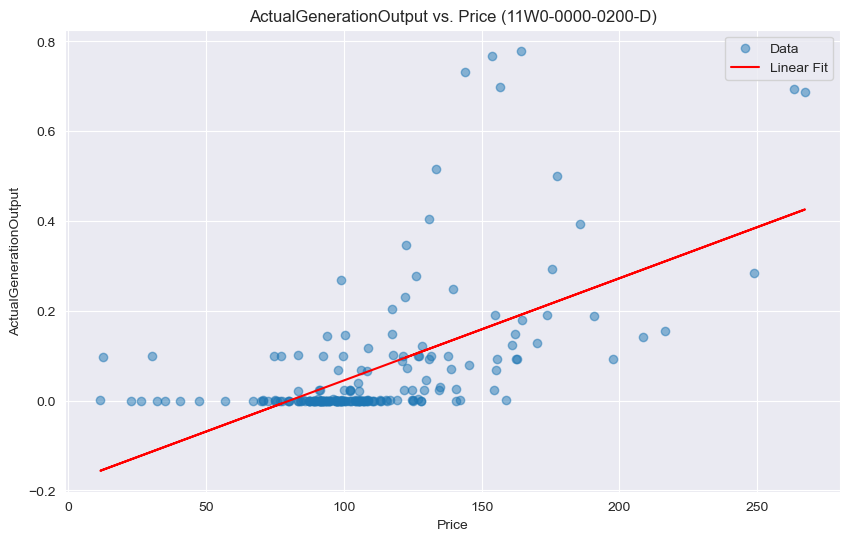

Generation Unit EIC: 11W0-0000-0200-D
Linear Regression Results:
Slope (Coefficient): 0.002276075564333602
Intercept: -0.18275234035536364
R-squared Value: 0.33572983950211316
P-value: 1.6527459659672765e-19
Standard Error: 0.00022638574615602697




In [10]:
# Iterate through the merged_data_by_eic dictionary
for generation_unit_eic, sub_df in merged_data_by_eic.items():
    # Check if the 'ProductionType' is 'Fossil Gas' and apply filters
    if 'Fossil Gas' in sub_df['ProductionType'].values:
        # Apply filters to remove rows with negative 'Price' and 'ActualGenerationOutput' > 'InstalledGenCapacity'
        #sub_df_filtered = sub_df[(sub_df['Price'] >= 0) & (sub_df['ActualGenerationOutput'] <= sub_df['InstalledGenCapacity']) & (sub_df[sub_df.index.year < 2020])]
        sub_df_filtered = sub_df

        # Perform linear regression
        slope, intercept, r_value, p_value, std_err = linregress(sub_df_filtered['Price'], sub_df_filtered['ActualGenerationOutput']/sub_df_filtered['InstalledGenCapacity'])

        # Plot the scatter plot and the linear fit
        plt.figure(figsize=(10, 6))
        plt.scatter(sub_df_filtered['Price'], sub_df_filtered['ActualGenerationOutput']/sub_df_filtered['InstalledGenCapacity'], alpha=0.5, label='Data')
        plt.plot(sub_df_filtered['Price'], intercept + slope * sub_df_filtered['Price'], 'r', label='Linear Fit')
        plt.title(f'ActualGenerationOutput vs. Price ({generation_unit_eic})')
        plt.xlabel('Price')
        plt.ylabel('ActualGenerationOutput')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Print the results
        print(f'Generation Unit EIC: {generation_unit_eic}')
        print(f'Linear Regression Results:')
        print(f'Slope (Coefficient): {slope}')
        print(f'Intercept: {intercept}')
        print(f'R-squared Value: {r_value**2}')
        print(f'P-value: {p_value}')
        print(f'Standard Error: {std_err}')
        print('\n')


   GenerationUnitEIC  MinimumPrice
0   11WD2BR14000113U           NaN
1   11WD2BRE4000115K         0.000
2   11WD2BURG000145R         0.000
3   11WD2GE2D000056A         0.000
4   11WD2GEB1000055R         0.000
..               ...           ...
59  11W0-0000-0467-W         0.984
60  11W0-0000-0494-T         0.192
61  11W0-0000-0196-1        89.354
62  11W0-0000-0197-Z           NaN
63  11W0-0000-0200-D        11.674

[64 rows x 2 columns]


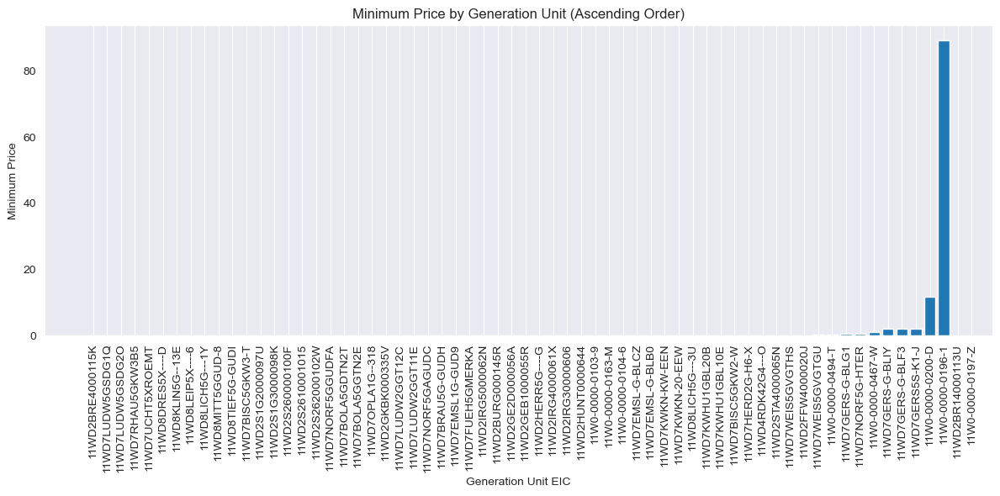

In [11]:
# Create an empty DataFrame to store the minimum prices and associated 'GenerationUnitEIC'
min_price_df = pd.DataFrame(columns=['GenerationUnitEIC', 'MinimumPrice'])

# Create a list to store individual DataFrames
dfs_to_concat = []

# Iterate through the merged_data_by_eic dictionary
for generation_unit_eic, sub_df in merged_data_by_eic.items():
    # Check if the 'ProductionType' is 'Fossil Gas' and apply filters
    if 'Fossil Gas' in sub_df['ProductionType'].values:
        # Apply filters to remove rows with negative 'Price' and 'ActualGenerationOutput' > 'InstalledGenCapacity'
        sub_df_filtered = sub_df[(sub_df['Price'] >= 0) & (sub_df['ActualGenerationOutput'] <= sub_df['InstalledGenCapacity'])]

        # Find the minimum 'Price' with positive 'ActualGenerationOutput'
        min_price = sub_df_filtered[sub_df_filtered['ActualGenerationOutput'] > 0]['Price'].min()

        # Create a DataFrame for the minimum price and 'GenerationUnitEIC'
        min_price_single_df = pd.DataFrame({'GenerationUnitEIC': [generation_unit_eic], 'MinimumPrice': [min_price]})

        # Append the DataFrame to the list for later concatenation
        dfs_to_concat.append(min_price_single_df)

# Concatenate all the individual DataFrames into min_price_df
if dfs_to_concat:
    min_price_df = pd.concat(dfs_to_concat, ignore_index=True)

# Display the DataFrame containing all minimum prices and associated 'GenerationUnitEIC'
print(min_price_df)

# Sort the DataFrame by 'MinimumPrice' in ascending order
min_price_df_sorted = min_price_df.sort_values(by='MinimumPrice', ascending=True)

# Create a bar plot of 'MinimumPrice' vs. 'GenerationUnitEIC'
plt.figure(figsize=(12, 6))
plt.bar(min_price_df_sorted['GenerationUnitEIC'], min_price_df_sorted['MinimumPrice'])
plt.title('Minimum Price by Generation Unit (Ascending Order)')
plt.xlabel('Generation Unit EIC')
plt.ylabel('Minimum Price')
plt.xticks(rotation=90)
plt.grid(axis='y')
plt.tight_layout()
plt.show()


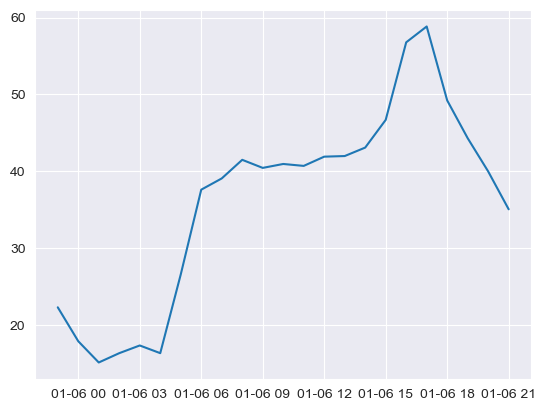

In [12]:
plt.plot(price[:23])